# Notebook plan

1. Regress out cell cycle
2. Recompute layout (neighbors, pca, umap) & look at clusters
3. Recompute clusters
   - and map old annotations to new clusters
4. Subcluster all populations except immature neurons
5. Look at marker genes

In [9]:
import scanpy as sc
import scanpy.external as sce
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb

In [10]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.3+116.g0075c62 anndata==0.6.22.post2.dev80+g72c2bde umap==0.3.9 numpy==1.17.2 scipy==1.3.0 pandas==0.24.1 scikit-learn==0.21.3 statsmodels==0.10.0rc2 python-igraph==0.7.1 louvain==0.6.1


# User input

In [11]:
adata_full = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/ipsc_ipd_patients_full.h5ad'

adata_full_noCC = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/ipsc_ipd_patients_full_noCC.h5ad'

adata_final = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/ipsc_ipd_patients_final.h5ad'

folder = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/'

marker_genes_base = 'intermediate_data/mnn_noCC_marker_genes_louvain'

# Read in data

In [12]:
adata = sc.read(adata_full)

In [13]:
adata

AnnData object with n_obs × n_vars = 30557 × 24920 
    obs: 'Demux_state', 'Donor', 'Lane', 'Number of genes', 'Total counts', 'age', 'condition', 'donor', 'gender', 'log_counts', 'mt_frac', 'n_counts', 'n_genes', 'size_factors', 'total_counts', 'years_of_illness', 'S_score', 'G2M_score', 'phase', 'louvain_r1', 'louvain_r0.5', 'louvain_r0.2', 'score', 'louvain_r0.2_0_sub', 'louvain_r0.2_0_4_sub', 'louvain_r0.2_0_3_sub', 'dpt_pseudotime'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Donor_colors', 'condition_colors', 'gender_colors', 'louvain', 'louvain_r0.2_0_3_sub_colors', 'louvain_r0.2_0_4_sub_colors', 'louvain_r0.2_0_sub_colors', 'louvain_r0.2_colors', 'louvain_r0.5_colors', 'louvain_r1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups_r0.2', 'rank_genes_r0.2_0_3_sub', 'rank_genes_r0.2_0_4_sub', 'rank_genes_r0.2_0_sub'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

# Summary plots

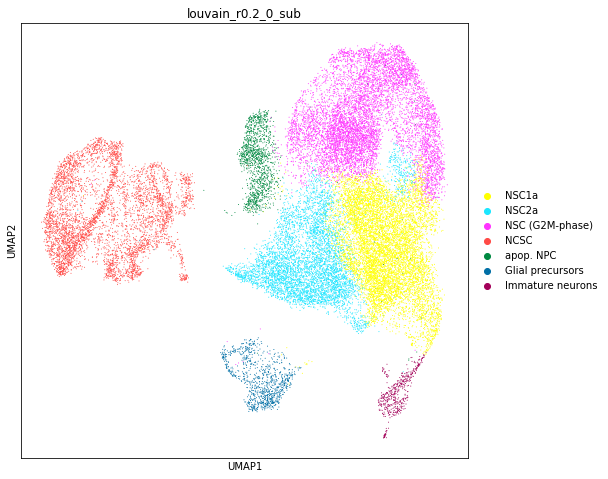

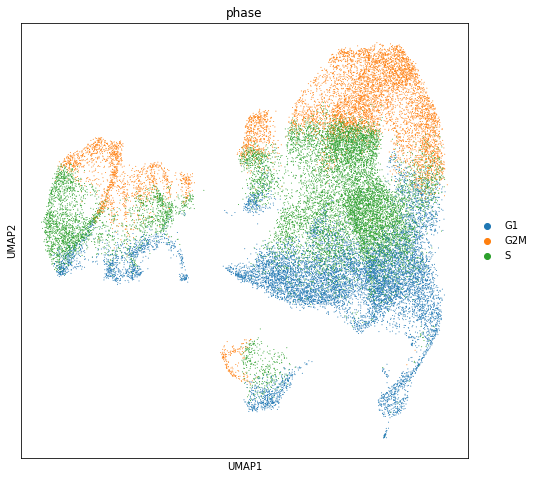

In [14]:
sc.pl.umap(adata, color='louvain_r0.2_0_sub')
sc.pl.umap(adata, color='phase')

# Regress out cell cycle

Regress out cell cycle scores calculated from gene list from Tirosh et al., Science (2016).

In [15]:
sc.pp.regress_out(adata, ['S_score', 'G2M_score'])

regressing out ['S_score', 'G2M_score']
    finished (0:14:11)


# Recalculate visualization

Note: We are not recalculating HVGs here as this would make it hard to compare to layout before regressing out CC.

In [16]:
# Remove raw (bug in current anndata)
adata.layers['logNorm'] = adata.raw.X
adata.raw = None

In [17]:
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/malte.luecken/anaconda3/envs/sc-tutorial/lib/python3.6/site-packages/umap/rp_tree.py:450: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "make_euclidean_tree" failed type inference due to: Cannot unify RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none) and RandomProjectionTreeNode(none, bool, array(float32, 1d, C), float64, RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none), RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none)) for '$16.16', defined at /home/icb/malte.luecken/anaconda3/envs/sc-tutorial/lib/python3.6/site-packages/umap/rp_tree.py (457)

File "../../../../../../../../../../../home/icb/malte.luecken/anaconda3/envs/sc-tutorial/lib/python3.6/site-packages/umap/rp_tree.py", line 457:
def make_euclidean_tree(data, indices, rng_state, leaf_size=30):
    <source elided>

        left_node = make_euclidean_tree(data, left_indices, rng_state, lea

    finished (0:00:14)


In [18]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:31)


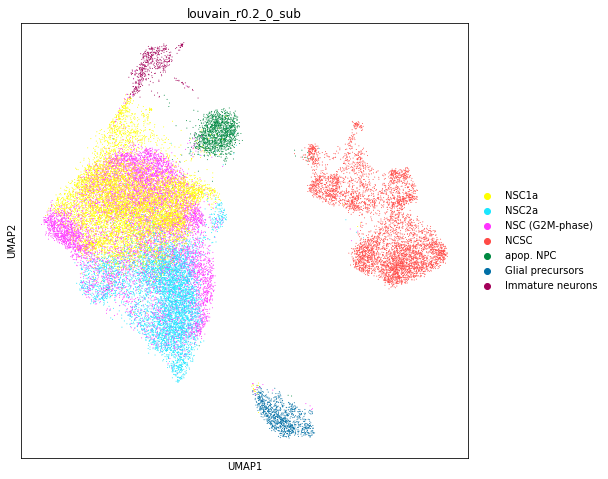

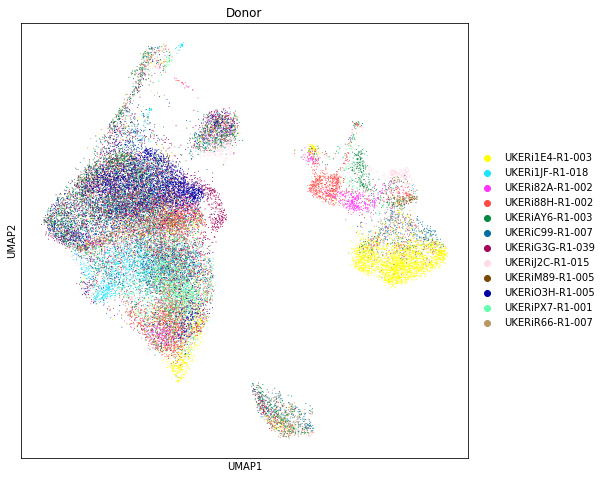

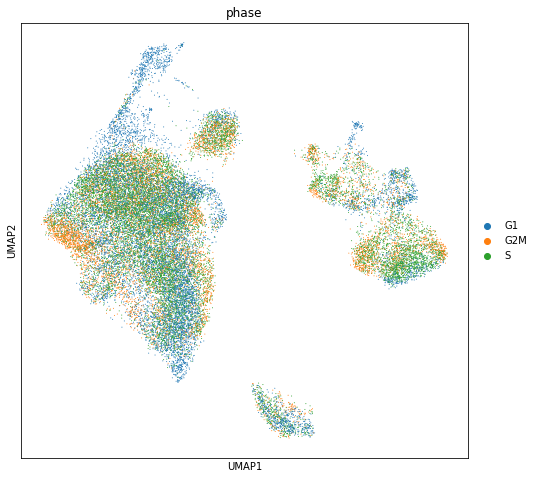

In [19]:
sc.pl.umap(adata, color='louvain_r0.2_0_sub')
sc.pl.umap(adata, color='Donor')
sc.pl.umap(adata, color='phase')

In [20]:
# Add raw again
adata_raw = adata.copy()
adata_raw.X = adata.layers['logNorm']
adata.raw = adata_raw

In [21]:
np.all(adata.raw.X == adata.layers['logNorm'])

True

In [22]:
del adata_raw
del adata.layers['logNorm']

Notes:
- NPC G2M-phase cluster is more spread out
- late NPC cluster looks closer to immature neurons (but still different, and should not overinterpret position in UMAP)
- NCSC shows even stronger separation by Donor

To do:
- [x] recluster whole data to see correspondence of clustering
- [x] subclustering main NSC cluster ('0') would make sense as main G2M-phase cluster is now spread.
- [x] subcluster 'late NPC' cluster as difficult to identify -> unlikely to produce more results
- [x] NCSC subclustering -> mainly Donor structure



# Reclustering

In [23]:
sc.tl.louvain(adata, resolution=0.2, key_added='louvain_r0.2_noCC')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:04)


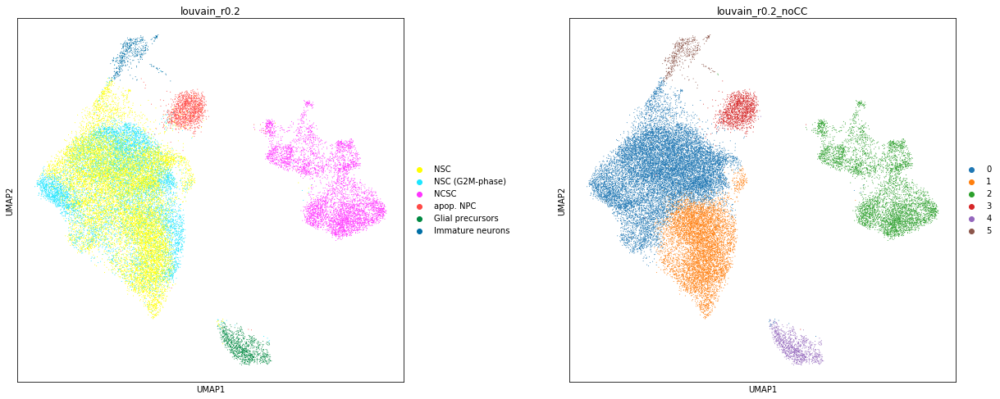

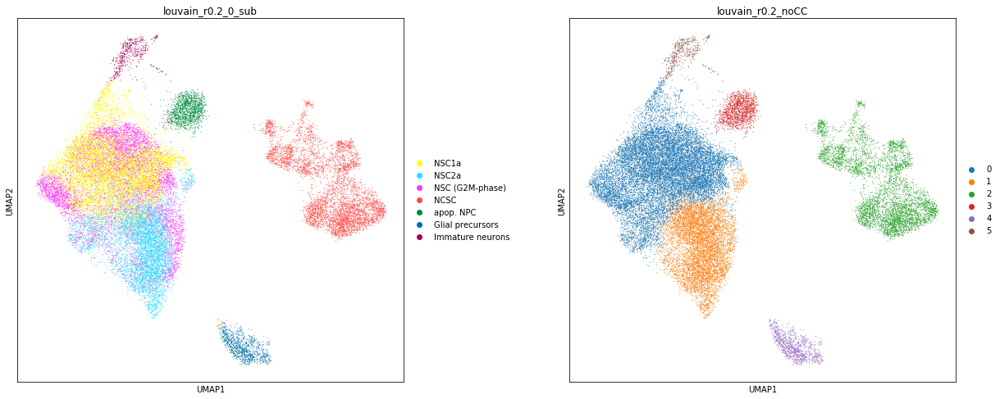

In [24]:
sc.pl.umap(adata, color=['louvain_r0.2', 'louvain_r0.2_noCC'], wspace=0.3)
sc.pl.umap(adata, color=['louvain_r0.2_0_sub', 'louvain_r0.2_noCC'], wspace=0.3)

## Selected gene plots from previous clustering results

In [25]:
adata.var_names[['WNT' in v for v in adata.var_names]]
adata.var_names[['SHH' in v for v in adata.var_names]]

Index(['WNT4', 'WNT2B', 'WNT9A', 'WNT7A', 'WNT5A', 'WNT5A-AS1', 'WNT16',
       'WNT11', 'WNT5B', 'WNT3', 'WNT7B'],
      dtype='object')

Index(['SHH'], dtype='object')

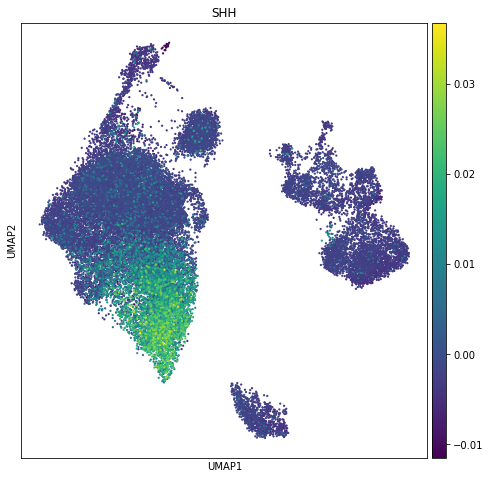

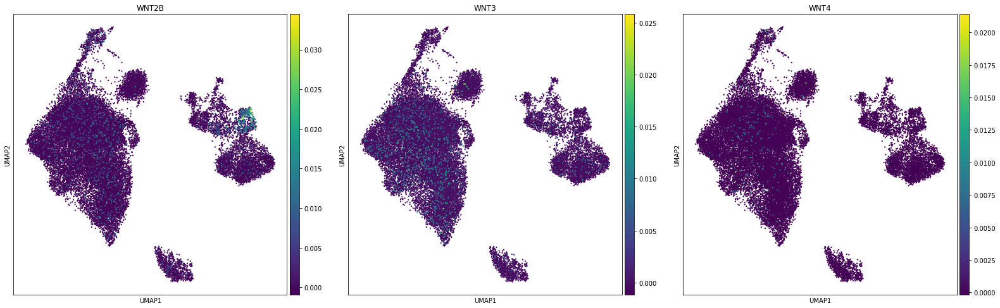

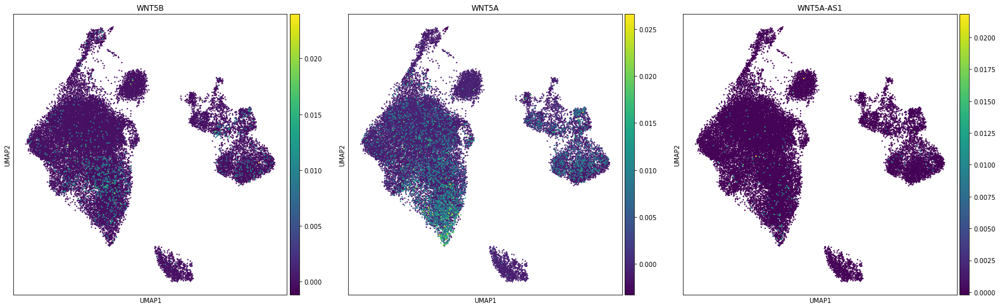

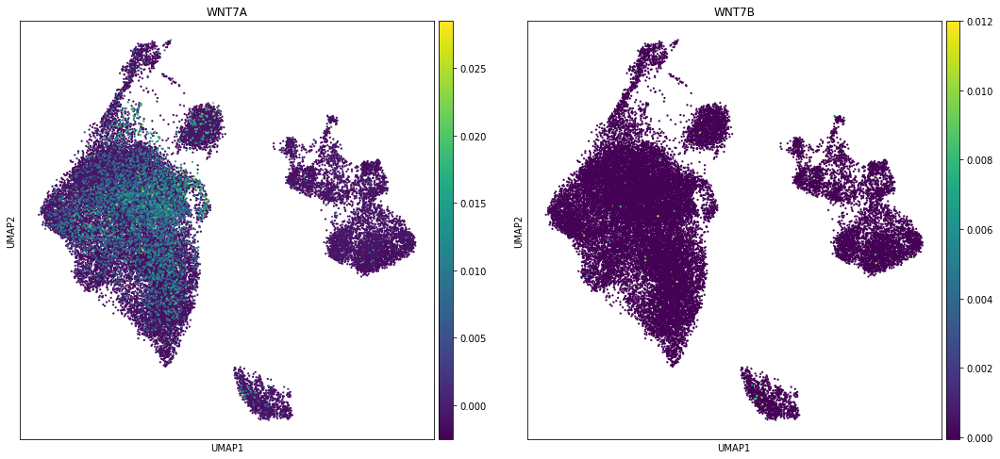

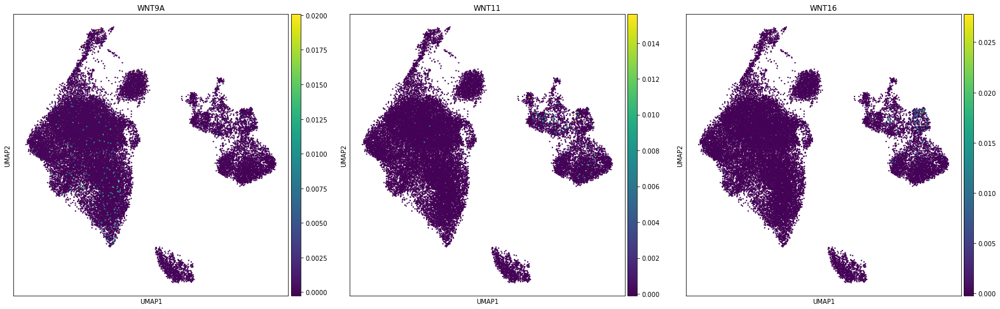

In [26]:
sc.pl.umap(adata, color='SHH', use_raw=False, size=20)
sc.pl.umap(adata, color=['WNT2B','WNT3', 'WNT4'], use_raw=False, size=20)
sc.pl.umap(adata, color=['WNT5B','WNT5A','WNT5A-AS1'], use_raw=False, size=20)
sc.pl.umap(adata, color=['WNT7A','WNT7B'], use_raw=False, size=20)
sc.pl.umap(adata, color=['WNT9A','WNT11', 'WNT16'], use_raw=False, size=20)

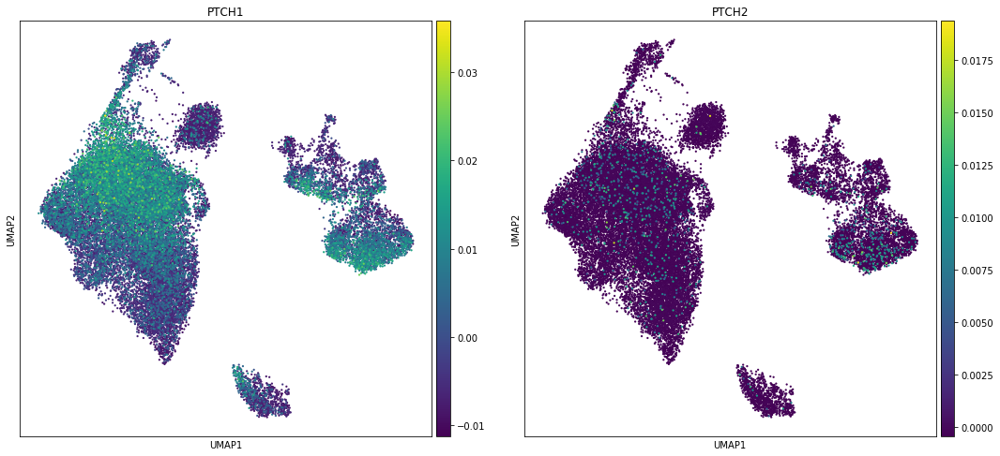

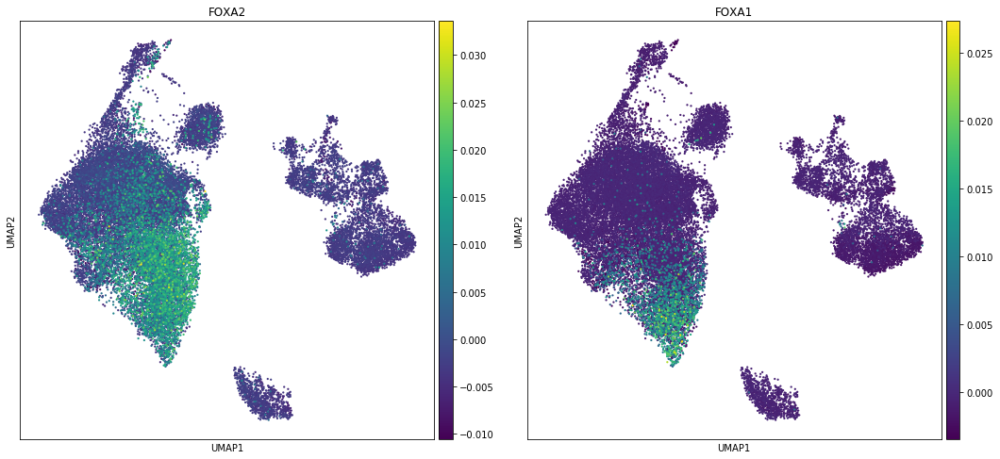

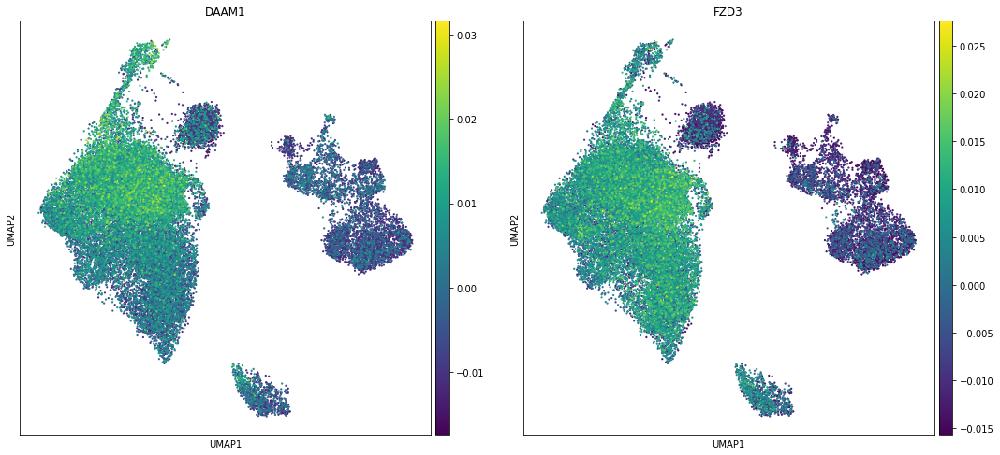

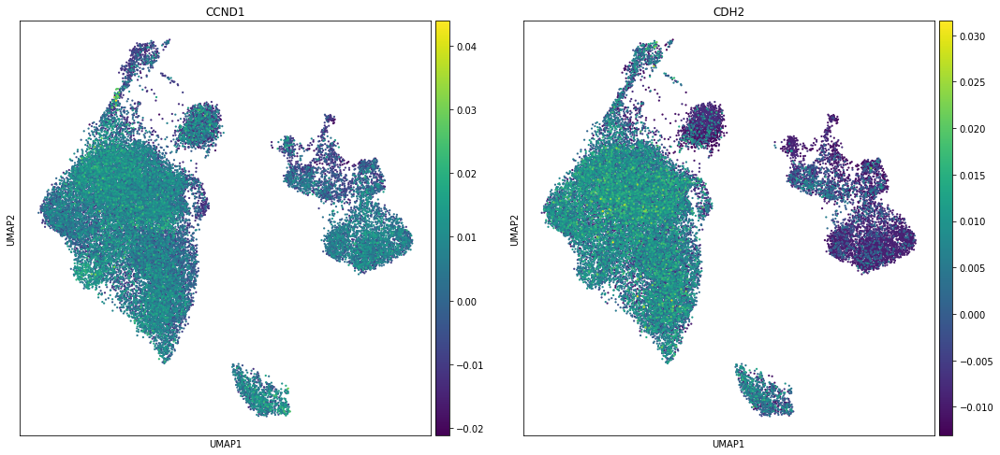

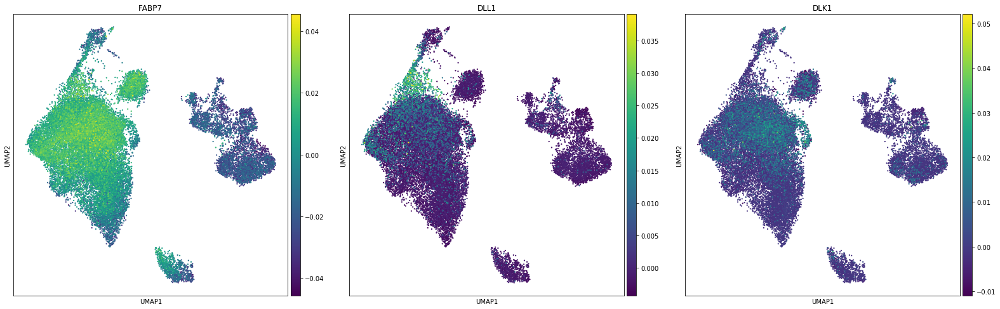

In [27]:
sc.pl.umap(adata, color=['PTCH1','PTCH2'], use_raw=False, size=20)
sc.pl.umap(adata, color=['FOXA2','FOXA1'], use_raw=False, size=20)
sc.pl.umap(adata, color=['DAAM1','FZD3'], use_raw=False, size=20)
sc.pl.umap(adata, color=['CCND1','CDH2'], use_raw=False, size=20)
sc.pl.umap(adata, color=['FABP7','DLL1', 'DLK1'], use_raw=False, size=20)


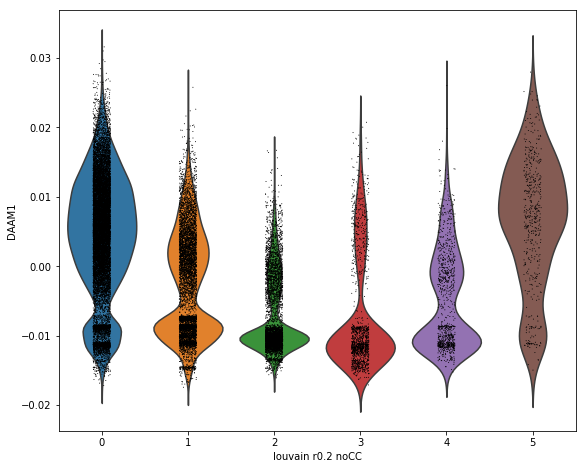

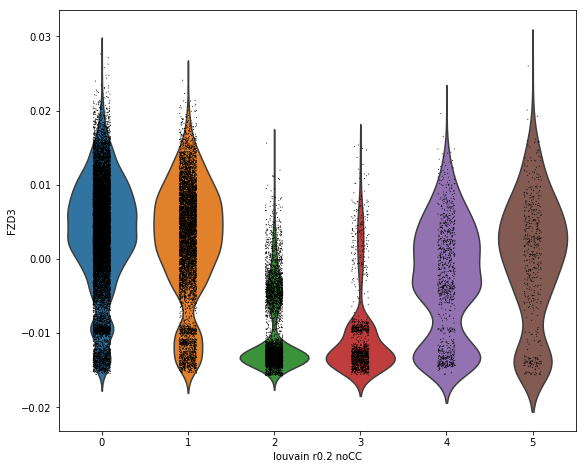

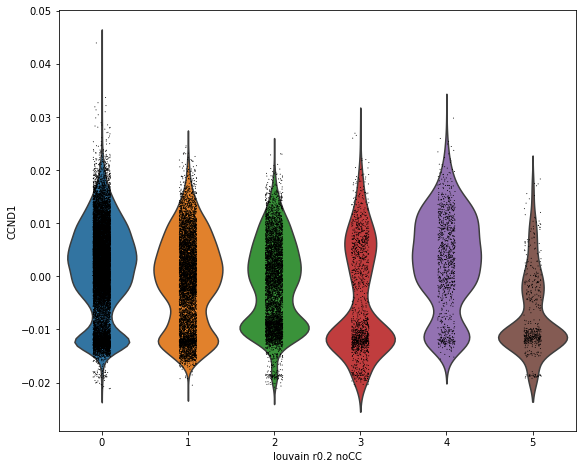

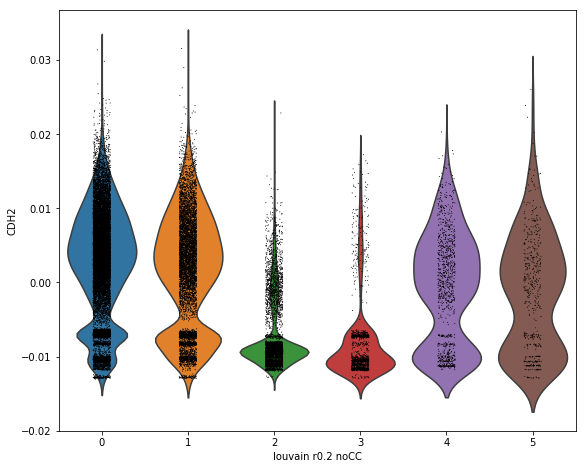

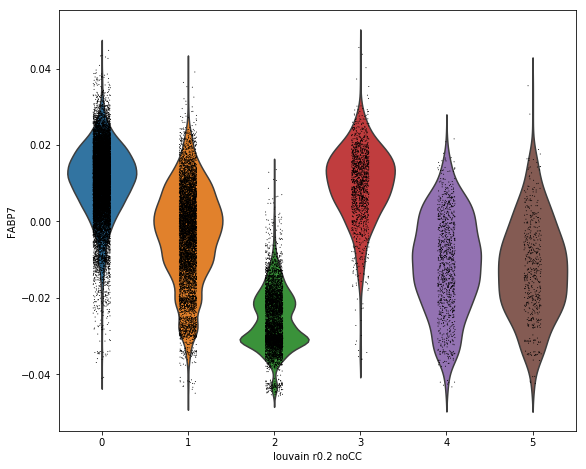

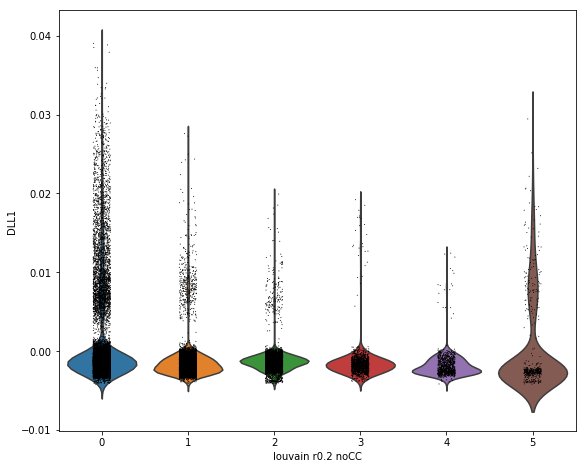

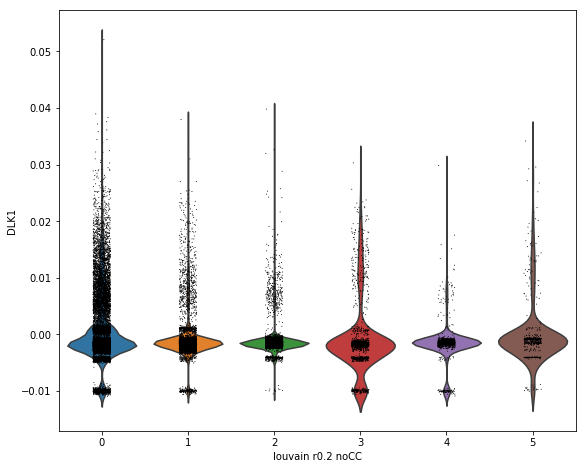

In [28]:
sc.pl.violin(adata, 'DAAM1', groupby='louvain_r0.2_noCC', use_raw=False)
sc.pl.violin(adata, 'FZD3', groupby='louvain_r0.2_noCC', use_raw=False)
sc.pl.violin(adata, 'CCND1', groupby='louvain_r0.2_noCC', use_raw=False)
sc.pl.violin(adata, 'CDH2', groupby='louvain_r0.2_noCC', use_raw=False)
sc.pl.violin(adata, 'FABP7', groupby='louvain_r0.2_noCC', use_raw=False)
sc.pl.violin(adata, 'DLL1', groupby='louvain_r0.2_noCC', use_raw=False)
sc.pl.violin(adata, 'DLK1', groupby='louvain_r0.2_noCC', use_raw=False)

### Comparison of clusterings before & after

In [29]:
pd.crosstab(adata.obs['louvain_r0.2'], adata.obs['louvain_r0.2_noCC'])

louvain_r0.2_noCC,0,1,2,3,4,5
louvain_r0.2,,,,,,
NSC,9177,5108,6,41,8,1
NSC (G2M-phase),6199,1923,3,24,12,6
NCSC,0,0,5203,0,0,0
apop. NPC,19,8,9,1326,3,4
Glial precursors,1,0,1,1,976,0
Immature neurons,2,0,2,1,0,493


In [30]:
pd.crosstab(adata.obs['louvain_r0.2_0_sub'], adata.obs['louvain_r0.2_noCC'])

louvain_r0.2_noCC,0,1,2,3,4,5
louvain_r0.2_0_sub,,,,,,
NSC1a,8348,302,2,32,8,1
NSC2a,829,4806,4,9,0,0
NSC (G2M-phase),6199,1923,3,24,12,6
NCSC,0,0,5203,0,0,0
apop. NPC,19,8,9,1326,3,4
Glial precursors,1,0,1,1,976,0
Immature neurons,2,0,2,1,0,493


# Marker genes for new clusters

In [31]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC', key_added='rank_genes_r0.2_noCC')

ranking genes
    finished (0:01:24)


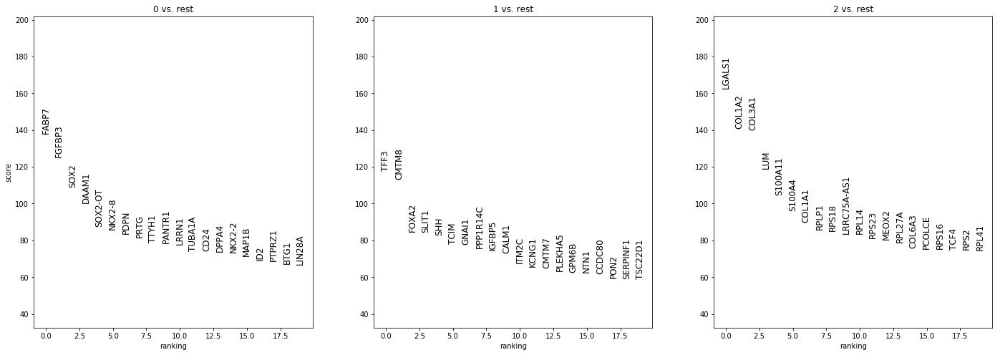

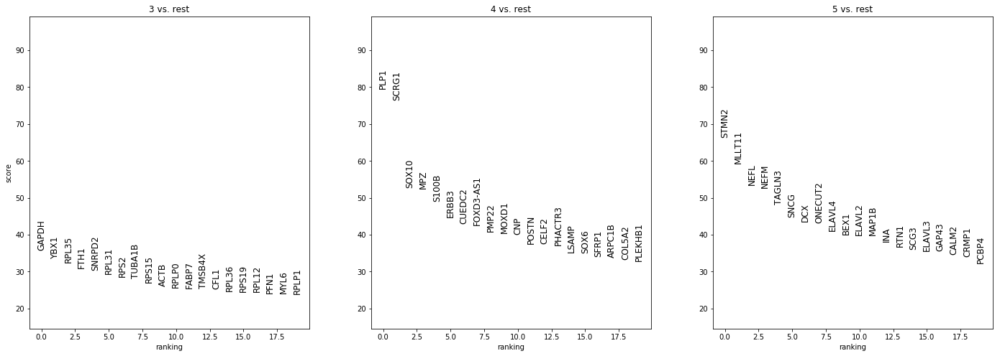

In [32]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC', groups=['0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC', groups=['3','4','5'], fontsize=12)

### Marker genes on corrected data (no CC, MNN integrated)

Use wilcoxon here as distribution assumptions are unlikely to be met in corrected data.

In [33]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC', key_added='rank_genes_r0.2_noCC_corr', use_raw=False, method='wilcoxon')

ranking genes


/home/icb/malte.luecken/new_scanpy/scanpy/scanpy/tools/_rank_genes_groups.py:388: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


    finished (0:01:55)


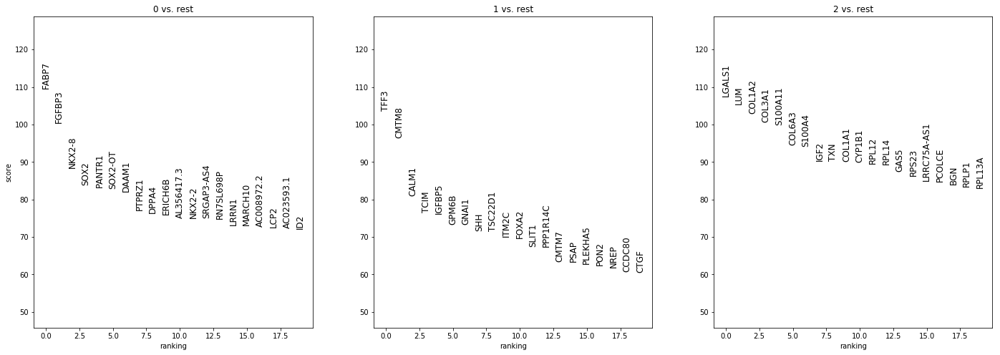

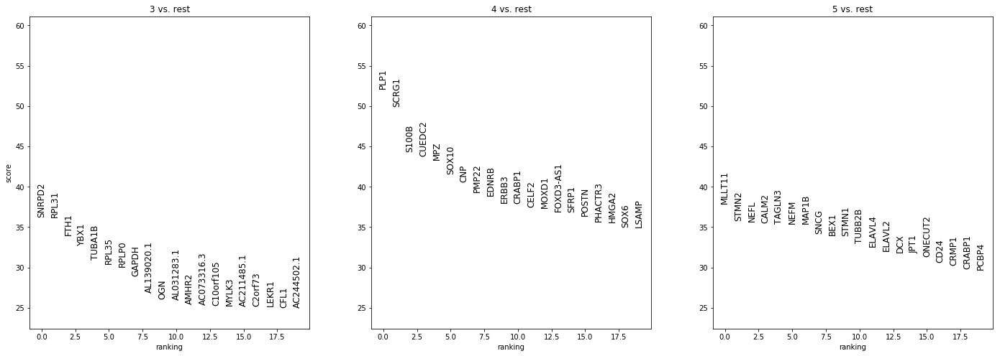

In [34]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_corr', groups=['0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_corr', groups=['3','4','5'], fontsize=12)

# Marker gene overlaps

In [36]:
marker_genes = dict()
marker_genes['NSC (radial glia)'] = ['NES', 'SOX2', 'NOTCH1', 'HES1', 'HES3', 'OCLN', 'CDH1', 'SOX10', 'SOX9', 'SOX1', 'ASCL1', 'NOTCH2', 'OTX2', 'FUT4']
marker_genes['NPC'] = ['HMGB2', 'SOX1', 'SOX2', 'SOX11', 'FABP7', 'SFRP1', 'SFRP2', 'PAX6', 'STMN2', 'DCX', 'NES', 'HES1', 'HES5', 'NCAM1', 'ASCL1', 'NOTCH2', 'NOTCH3', 'TNFRSF19', 'OTX2']
marker_genes['NPC (late) / Imm. Neurons'] = ['EOMES', 'ASCL1', 'NEUROD1', 'DCX', 'NCAM1', 'MAP2', 'TUBB3', 'TUBB2A', 'ENO2', 'RBFOX3', 'NKX2-2', 'NGFR', 'HES5', 'CALB1', 'CALB2', 'EFNA2']
marker_genes['Dopaminergic'] = ['NR4A2', 'PBX1', 'GRIA3', 'TH', 'EN1', 'TMCC3', 'NTM', 'DDC', 'CAMK2N1', 'ALDH1A1', 'APP', 'PDZRN4', 'PCDH10', 'MEG3', 'ERBB4', 'SLC10A4', 'BEX5', 'FOXA2', 'NPY1R', 'GPC2', 'KCNJ6', 'LMX1B']
marker_genes['Glutamatergic'] = ['SLC1A1', 'SLC1A2', 'SLC1A3', 'SLC17A6', 'SLC17A7', 'GLS', 'GLS2', 'GRIN1', 'GRIN2A', 'GRIN2B', 'GRIN2C', 'GRIN2D', 'GRIN3A', 'GRIN3B', 'GRINA', 'GRIA1', 'GRIA2', 'GRIA3', 'GRIA4']
marker_genes['GABAergic'] = ['GAD1', 'GAD2', 'GABARAP', 'GABARAPL1', 'GABARAPL2', 'GABARAPL3', 'ABAT']
marker_genes['Serotonergic'] = ['SLC6A4', 'SLC18A2', 'TPH1', 'TPH2', 'FEV', 'HTR1D', 'HTR1DP1', 'HTR1E', 'HTR1F', 'HTR2A', 'HTR2A-AS1', 'HTR2B', 'HTR2C', 'HTR3A', 'HTR3B', 'HTR3D', 'HTR4', 'HTR5A', 'HTR5A-AS1', 'HTRA2', 'HTRA3', 'HTRA4', 'HTR5BP', 'HTR7P1', 'HTRA1']
marker_genes['NSC (neural crest)'] = ['COL3A1', 'COL1A2', 'LUM', 'INHCAP', 'IGF2', 'SEPT11', 'LGALS1', 'WNT2B', 'SNAI1', 'SNAI2', 'TFAP2A', 'FOXD3', 'TWIST1', 'ID1', 'MYC', 'SOX9', 'SOX10']
marker_genes['Glial precursor'] = ['VIM', 'S100B', 'SOX10', 'LGALS1', 'OLIG1', 'OLIG2', 'OLIG3', 'SCRG1', 'PDGFRA', 'NKX2-2', 'EGFR', 'NES']
marker_genes['OPC'] = ['PDGFRA', 'CSPG4', 'STMN1', 'STMN2', 'PLP1', 'OLIG1', 'OLIG2', 'OLIG3', 'CLDN11', 'MBP', 'MAG', 'SOX10', 'RTN4']
marker_genes['Astrocyte precursor'] = ['S100B', 'FABP7', 'OLIG2', 'TTYH1', 'VCAM1', 'UCHL1', 'UBL3', 'TUBB3', 'TTYH2', 'S100A13', 'S100A16', 'NCAN', 'MEIS1', 'FABP5', 'DBX2', 'C1orf122', 'NOTCH3', 'NOTCH2', 'NKAIN4', 'DCXR', 'DCN', 'CD63', 'CD24', 'CCDC80', 'CBS', 'TCIM', 'C3orf70', 'C2orf72', 'C1orf61', 'GFAP', 'SLC1A3', 'SLC1A2', 'ALDH1L1', 'GLUL', 'PBXIP1'] #Similar to glial precursors
marker_genes['Microglia'] = ['VAMP8', 'VAV1', 'VMP1', 'VSIG4', 'TLR10', 'TLR4', 'TLR7', 'STAB1', 'STMN1', 'SOX11', 'SOX4', 'SP100', 'TMEM273', 'TPX2', 'C2', 'C1QC', 'C1QB', 'C1QA', 'C1orf61', 'C12orf75', 'VSIR', 'ITGAM', 'PTPRC', 'AIF1', 'CD68', 'CD40']
marker_genes['Schwann cell precursor'] = ['SOX10', 'GAP43', 'FABP7', 'MPZ', 'DHH', 'NGFR', 'S100B']

In [37]:
marker_genes_2 = dict()
marker_genes_2['NSC radial glia'] = ['NES', 'SOX2', 'HES1', 'HES3', 'FABP7', 'SLC1A3']
marker_genes_2['NPC'] = ['SOX1', 'SOX2', 'PAX6', 'NES', 'HES1', 'HES5', 'GLI3']
marker_genes_2['NPC late and Imm. Neurons'] = ['DCX', 'MAP2', 'TUBB3', 'NKX2-2', 'CALB1', 'CALB2', 'ASCL1', 'NEUROD1']
marker_genes_2['Dopaminergic'] = ['NR4A2', 'PBX1', 'TH', 'EN1', 'FOXA2', 'LMX1B', 'EN2']
marker_genes_2['Glutamatergic'] = ['GRIN1', 'GRIN2A', 'GRIN2B', 'GRIN2C', 'GRIN2D', 'GRIN3A', 'GRIN3B', 'GRINA', 'GRIA1', 'GRIA2', 'GRIA3', 'GRIA4']
marker_genes_2['GABAergic'] = ['GAD1', 'GAD2']
marker_genes_2['Serotonergic'] = ['TPH1', 'TPH2', 'SLC6A4', 'FEV']
marker_genes_2['Cholinergic'] = ['CHAT', 'SLC18A3', 'ACHE']
marker_genes_2['NSC neural crest'] = ['LUM', 'SNAI1', 'TWIST1', 'SOX9', 'SOX10', 'SNAI2', 'B3GAT1']
marker_genes_2['OPC'] = ['PDGFRA', 'STMN1', 'STMN2', 'OLIG1', 'OLIG2', 'OLIG3', 'SOX10', 'CSPG4']
marker_genes_2['Astrocyte precursor'] = ['S100B', 'GFAP', 'CD44', 'VIM', 'ALDOC']
marker_genes_2['Microglia'] = ['SOX11', 'SOX4', 'PTPRC', 'CD68', 'ITGAM', 'AIF1']
marker_genes_2['Schwann cell precursor'] = ['SOX10', 'GAP43', 'FABP7', 'MPZ', 'DHH', 'NGFR']

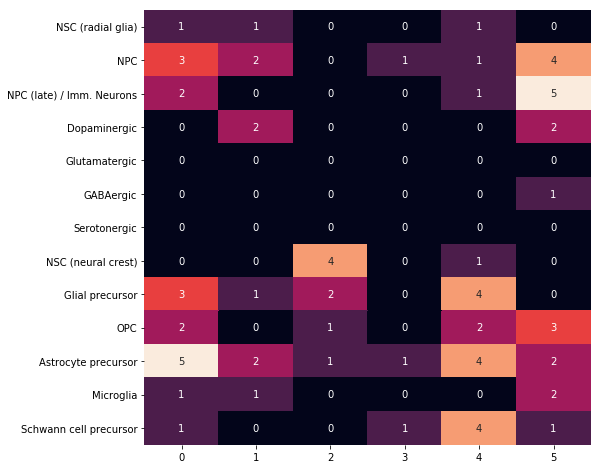

In [38]:
sb.heatmap(sc.tl.marker_gene_overlap(adata, reference_markers=marker_genes, key='rank_genes_r0.2_noCC'), cbar=False, annot=True)

Note: No informative marker gene overlaps

# Subclustering

In [39]:
adata.obs['louvain_r0.2_0_sub'].cat.categories

Index(['NSC1a', 'NSC2a', 'NSC (G2M-phase)', 'NCSC', 'apop. NPC',
       'Glial precursors', 'Immature neurons'],
      dtype='object')

## 3: late NPC

In [40]:
sc.tl.louvain(adata, restrict_to=('louvain_r0.2_noCC', ['3']), resolution=0.4, key_added='louvain_r0.2_noCC_3_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


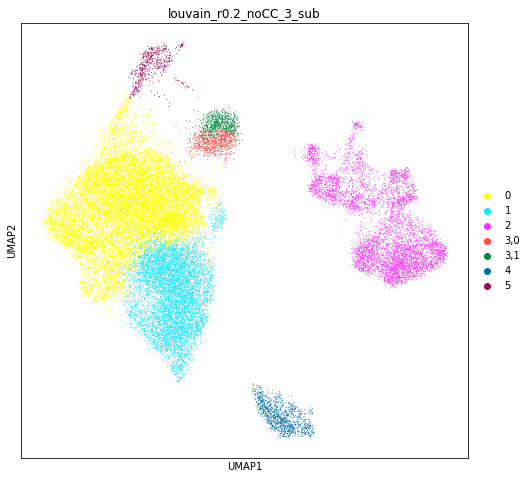

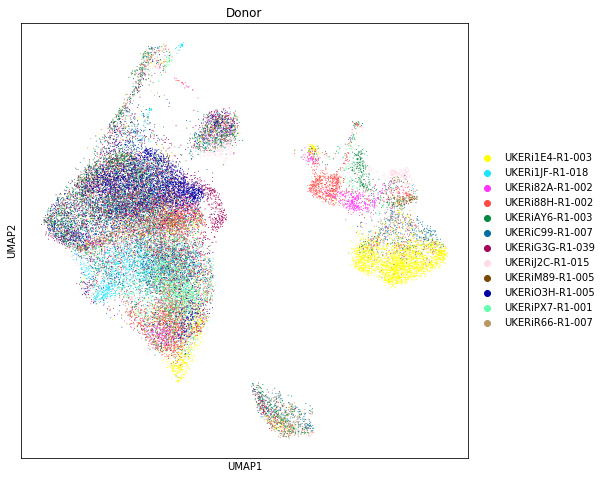

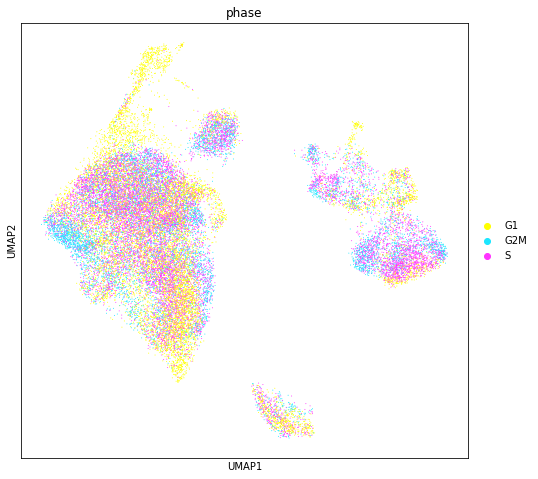

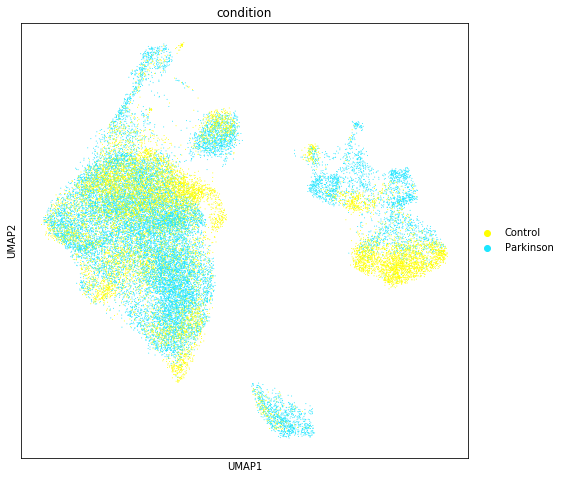

In [41]:
#Show the new clustering
sc.pl.umap(adata, color='louvain_r0.2_noCC_3_sub', palette=sc.pl.palettes.godsnot_64)
sc.pl.umap(adata, color='Donor', palette=sc.pl.palettes.godsnot_64)
sc.pl.umap(adata, color='phase', palette=sc.pl.palettes.godsnot_64)
sc.pl.umap(adata, color='condition', palette=sc.pl.palettes.godsnot_64)

In [42]:
adata.obs['condition_val'] = [0 if c=='Control' else 1 for c in adata.obs.condition]

In [43]:
adata.obs.groupby('louvain_r0.2_noCC').mean()['condition_val']
adata.obs.groupby('louvain_r0.2_noCC_3_sub').mean()['condition_val']


louvain_r0.2_noCC
0    0.604104
1    0.711323
2    0.451378
3    0.700646
4    0.844845
5    0.793651
Name: condition_val, dtype: float64

louvain_r0.2_noCC_3_sub
0      0.604104
1      0.711323
2      0.451378
3,0    0.854817
3,1    0.527439
4      0.844845
5      0.793651
Name: condition_val, dtype: float64

In [44]:
adata.obs.condition.value_counts(normalize=True)

Parkinson    0.618091
Control      0.381909
Name: condition, dtype: float64

In [45]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC_3_sub', key_added='rank_genes_r0.2_noCC_3_sub')

ranking genes
    finished (0:01:31)


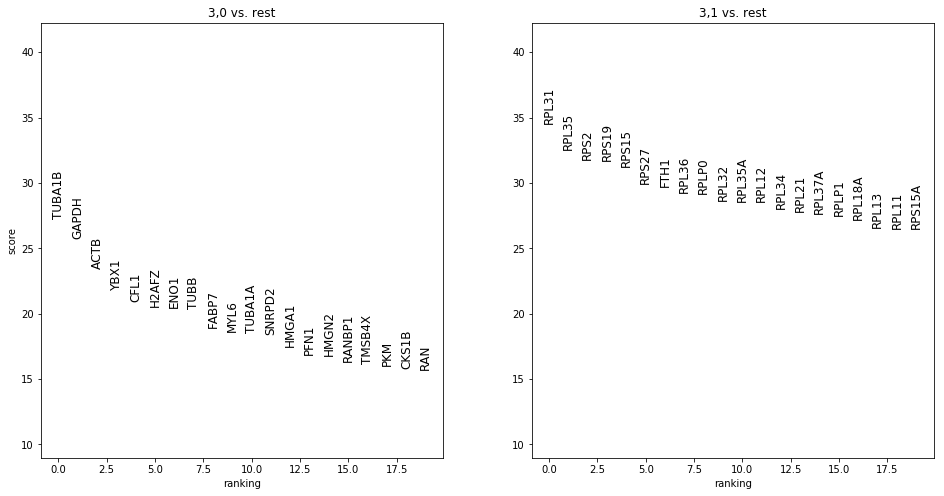

In [46]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_3_sub', groups=['3,0','3,1'], fontsize=12)

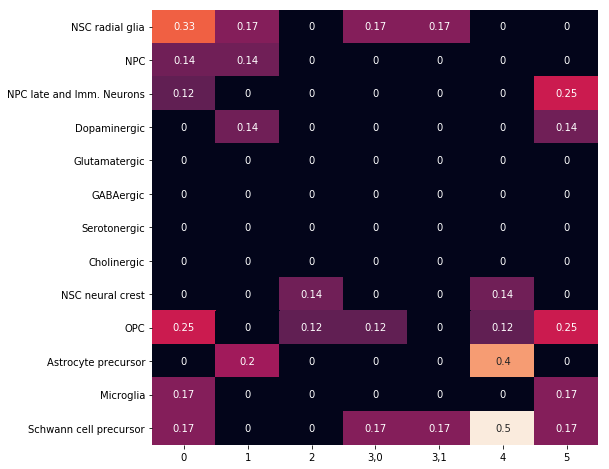

In [47]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes_2, key='rank_genes_r0.2_noCC_3_sub', normalize='reference'), cbar=False, annot=True)

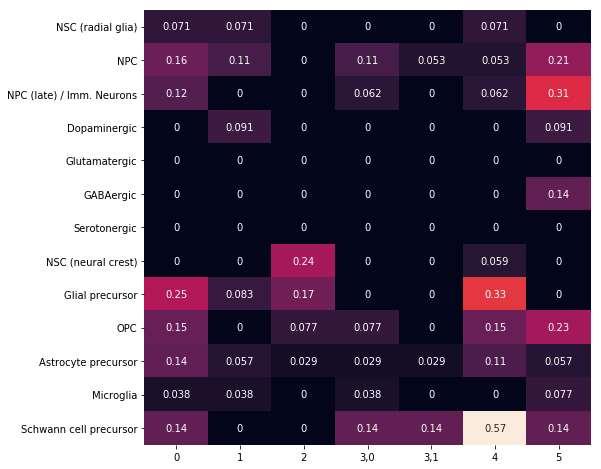

In [48]:
#Overlap with older marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r0.2_noCC_3_sub', normalize='reference'), cbar=False, annot=True)

Notes:
- no meainigful marker gene overlaps in the cluster.


-> should look at differences between the two subclusters 

### Comparison between 3,0 and 3,1:

In [49]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC_3_sub', groups=['3,0'], reference='3,1', key_added='rank_genes_r0.2_noCC_3_sub_comp0')
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC_3_sub', groups=['3,1'], reference='3,0', key_added='rank_genes_r0.2_noCC_3_sub_comp1')

ranking genes
    finished (0:00:00)
ranking genes
    finished (0:00:00)


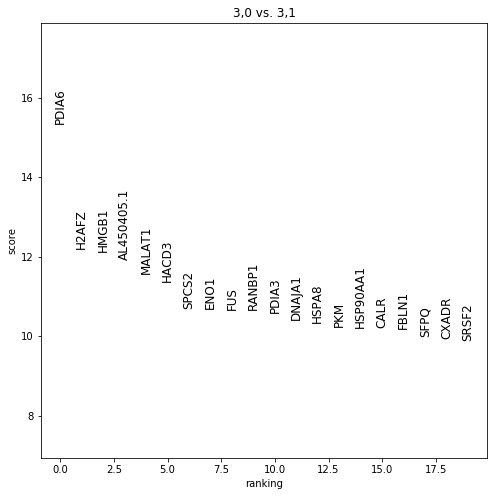

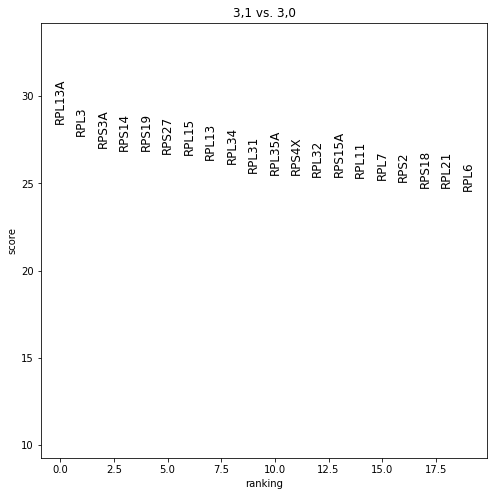

In [50]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_3_sub_comp0', groups=['3,0'], fontsize=12)
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_3_sub_comp1', groups=['3,1'], fontsize=12)

Notes:
- no large differences, most importantly in 2 genes.
- Probably not a meaningful separation

# Highly expressed genes in cluster 3:

In [51]:
adata_clust3 = adata[[c == '3' for c in adata.obs['louvain_r0.2_noCC']]].copy()

normalizing by total count per cell
filtered out 1392 cells that haveless than 1 counts
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


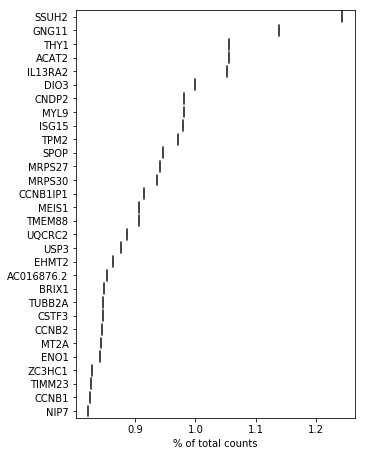

In [52]:
sc.pl.highest_expr_genes(adata_clust3, n_top=30)

In [53]:
adata_clust3.X = adata_clust3.raw.X

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


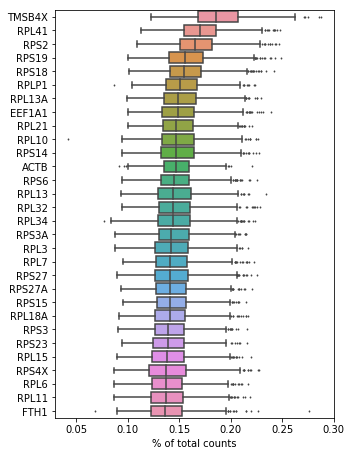

In [54]:
sc.pl.highest_expr_genes(adata_clust3, n_top=30)

Note the different results when computed on the log-normalized, integrated, and CC corrected data (above), and the log-normalized data (below).

### Output marker genes

Note: Especially of interest are clusters 0, 1, and 3.

In [55]:
pd.DataFrame(adata.uns['rank_genes_r0.2_noCC_3_sub']['names']).to_csv(folder+marker_genes_base+'_r0.2_noCC_3_sub.csv')

In [56]:
pd.DataFrame(adata.uns['rank_genes_r0.2_noCC']['names']).to_csv(folder+marker_genes_base+'_r0.2_noCC.csv')

In [57]:
pd.DataFrame(adata.uns['rank_genes_r0.2_noCC_corr']['names']).to_csv(folder+marker_genes_base+'_r0.2_noCC_corr.csv')

# Rename clusters

In [66]:
adata.rename_categories('louvain_r0.2_noCC', ['NSC1', 'NSC2', 'NCSC', 'apop. NPC', 'Glial precursors', 'immature neurons'])

# Apoptosis markers in cluster 3 ('late NPC')

In [59]:
apoptosis_markers = ['TP53', 'TP73', 'CDKN1A', 'PCNA', 'DDB2', 'XPC', 'BAX', 'NOXA1', 'BBC3', 'DIABLO']

In [60]:
# Are the genes in the object?
[g in adata.var_names for g in apoptosis_markers]

[True, True, True, True, True, True, True, True, True, False]

In [67]:
# Are apoptosis markers in marker gene list?
[g in adata.uns['rank_genes_r0.2_noCC']['names']['apop. NPC'] for g in apoptosis_markers]
[g in adata.uns['rank_genes_r0.2_noCC_corr']['names']['apop. NPC'] for g in apoptosis_markers]

[False, False, False, False, False, False, False, False, False, False]

[False, False, False, False, False, False, False, False, False, False]

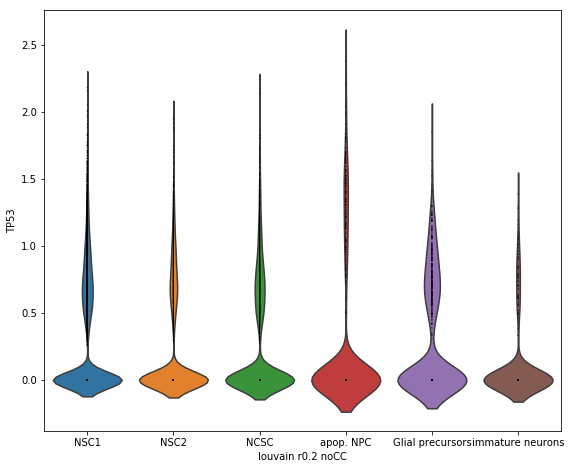

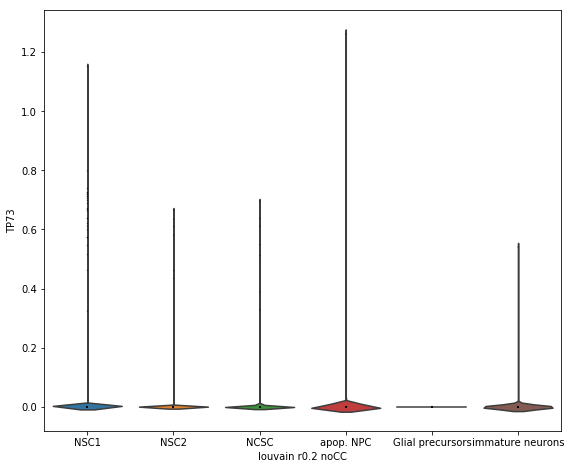

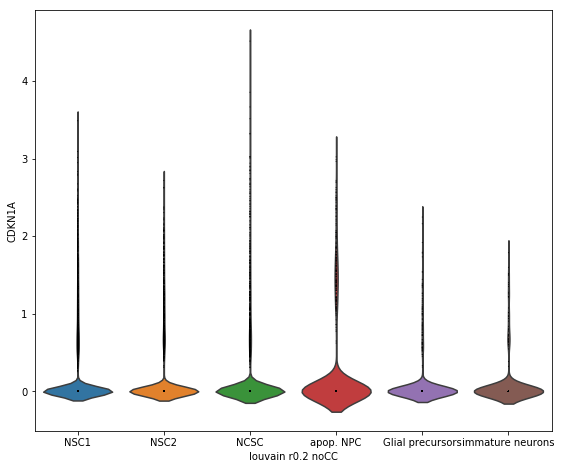

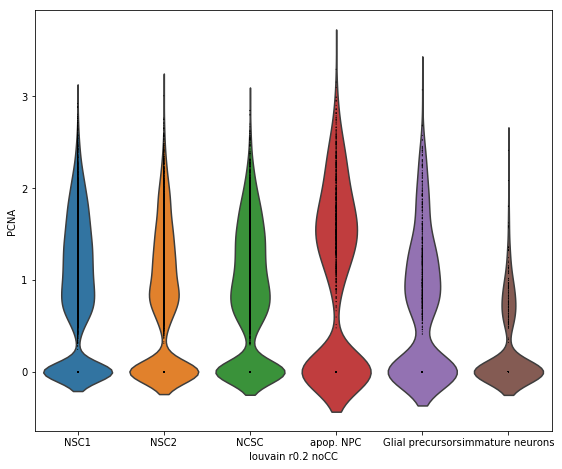

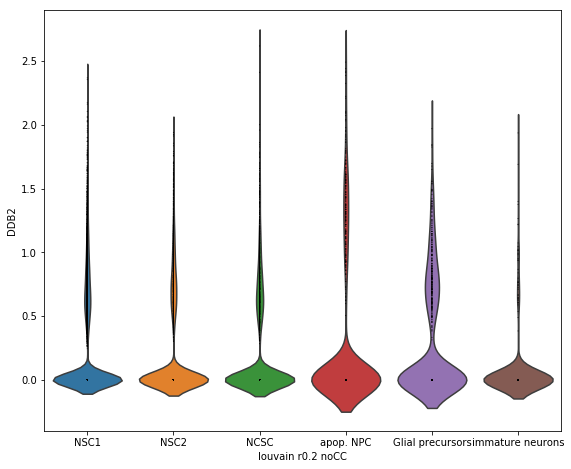

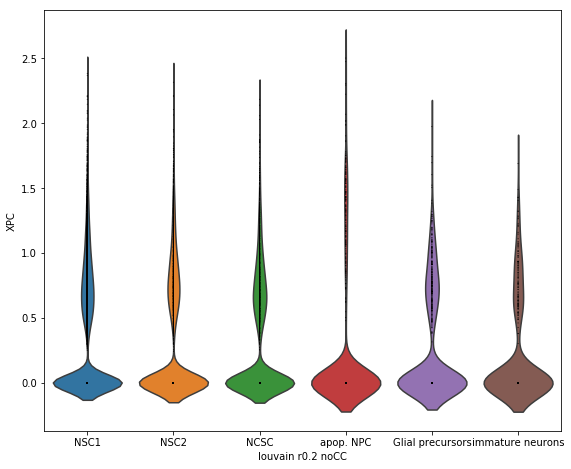

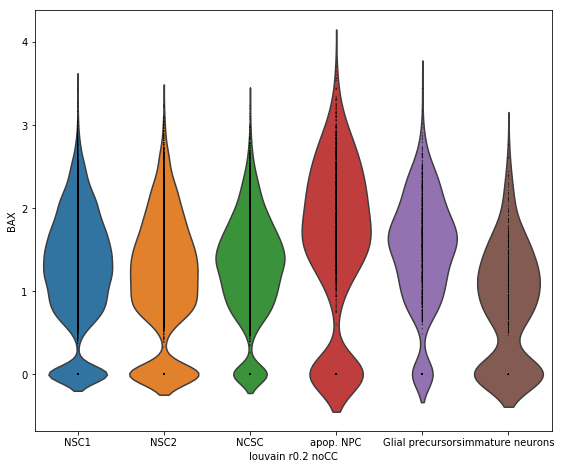

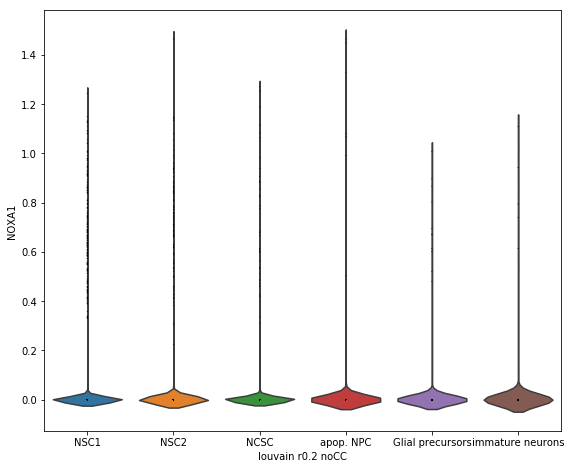

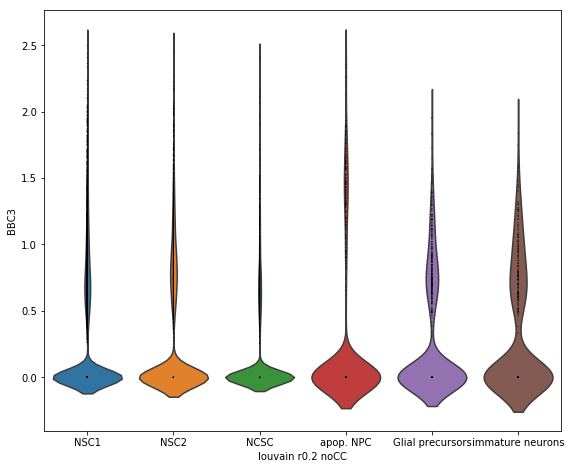

In [68]:
# Distributions on log-normalized data
for gene in apoptosis_markers:
    if gene in adata.var_names:
        sc.pl.violin(adata, gene, groupby='louvain_r0.2_noCC', use_raw=True, jitter=False)

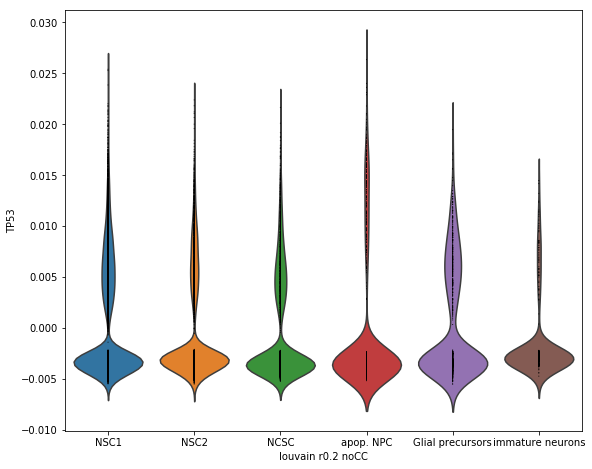

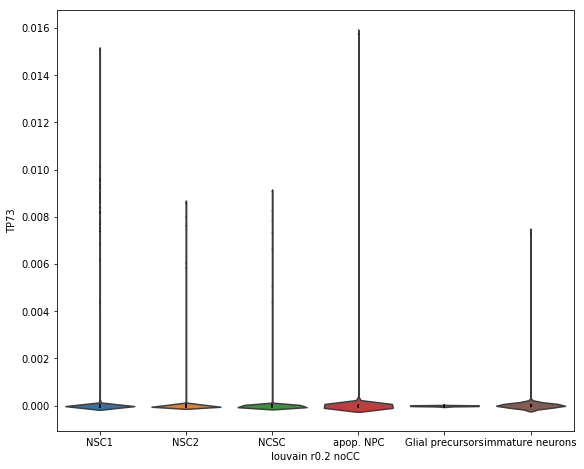

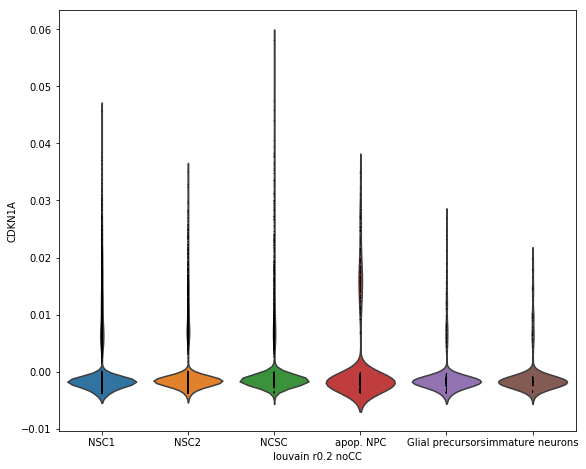

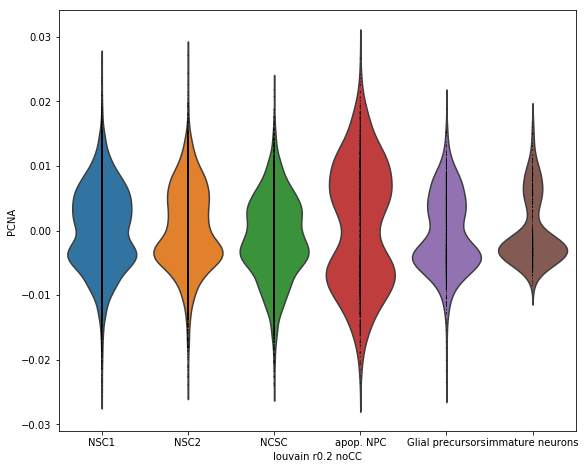

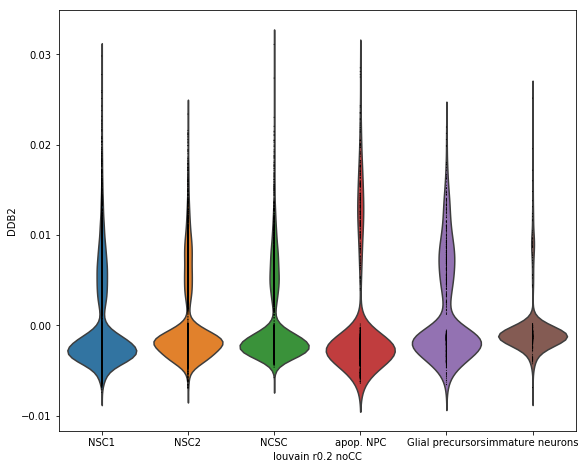

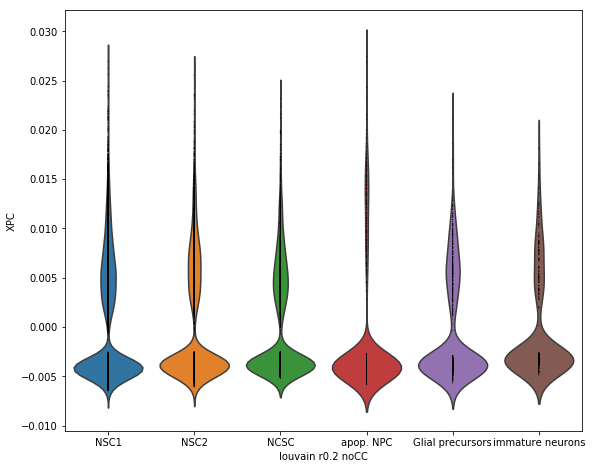

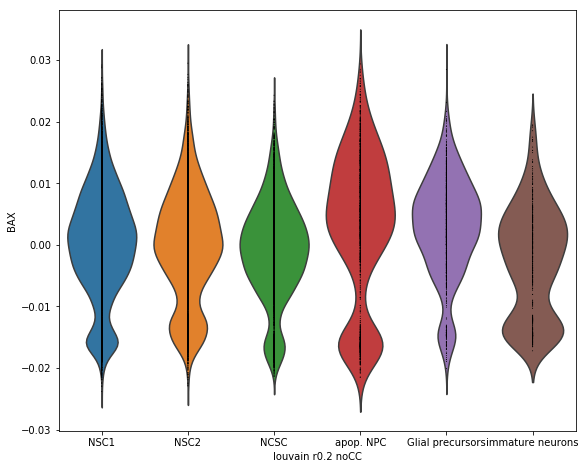

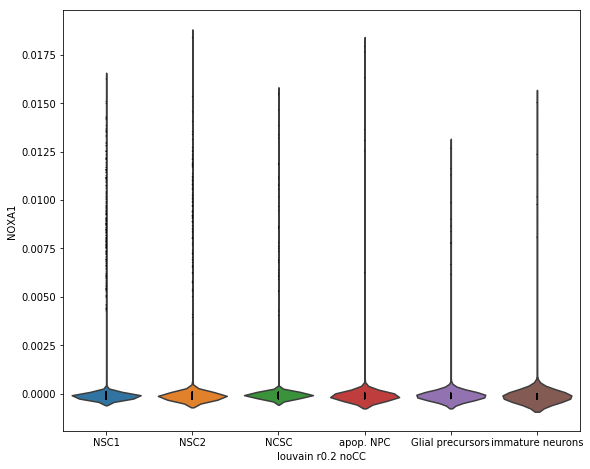

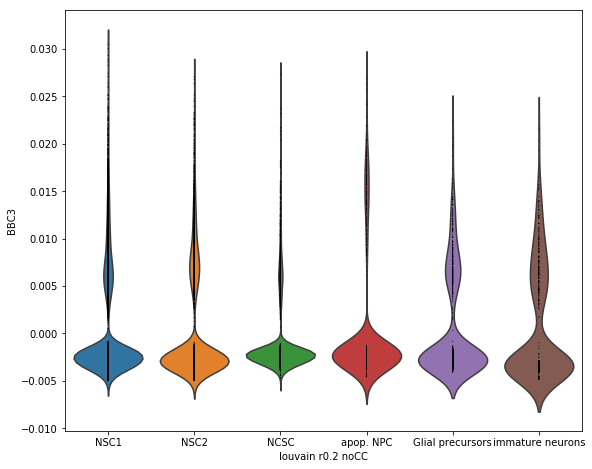

In [69]:
# Distributions on corrected data
for gene in apoptosis_markers:
    if gene in adata.var_names:
        sc.pl.violin(adata, gene, groupby='louvain_r0.2_noCC', use_raw=False, jitter=False)

In [70]:
adata_test = adata.copy()
adata_test.X = adata.layers['counts']

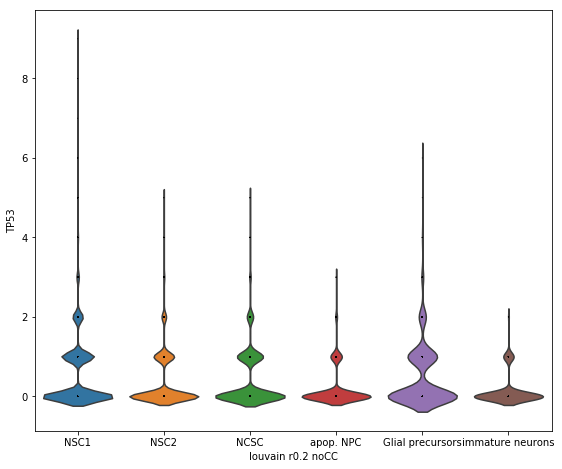

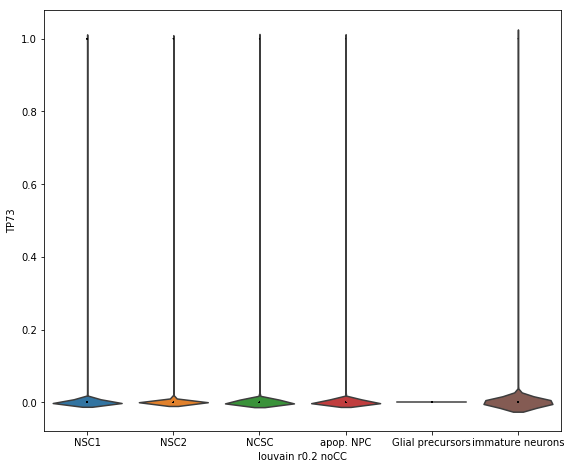

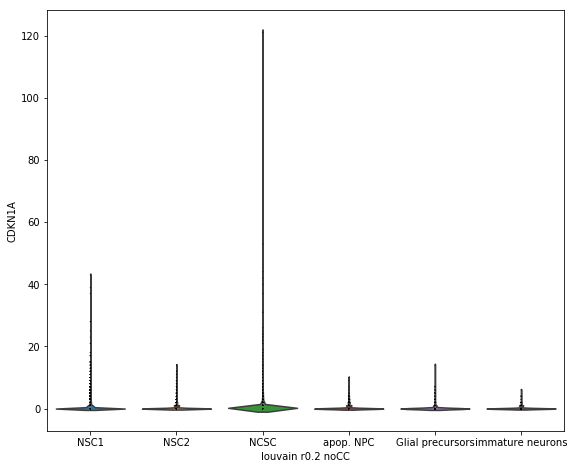

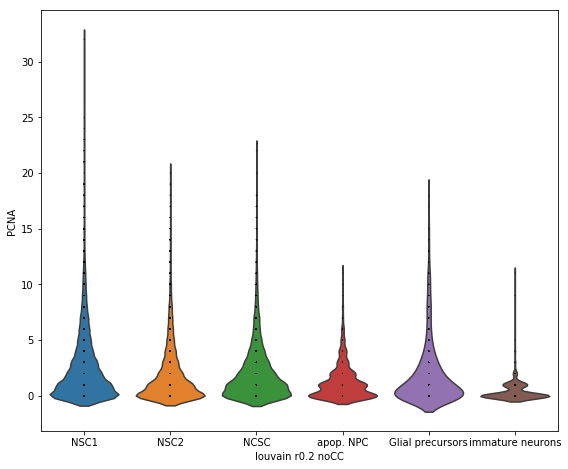

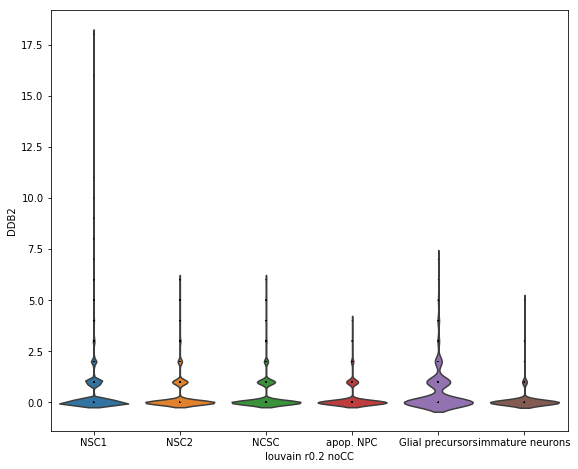

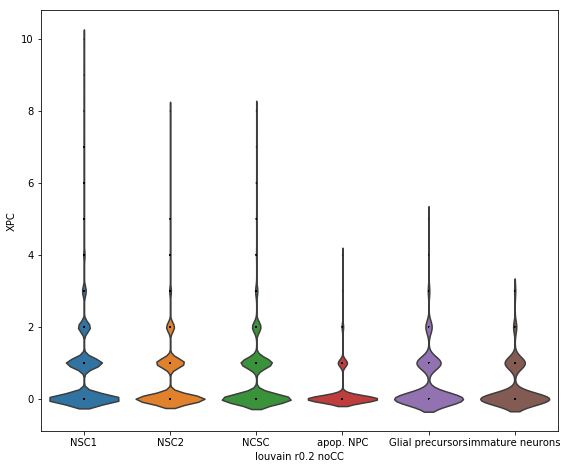

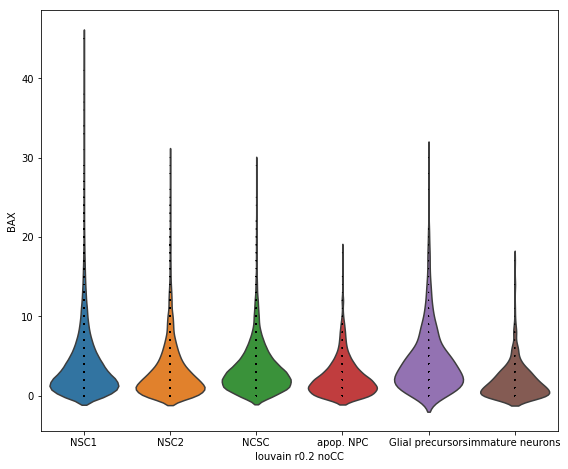

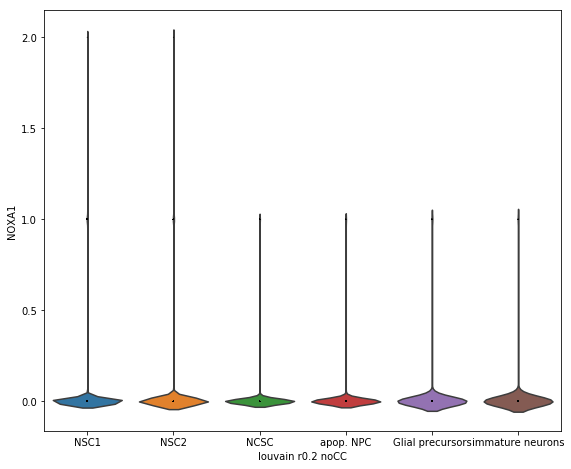

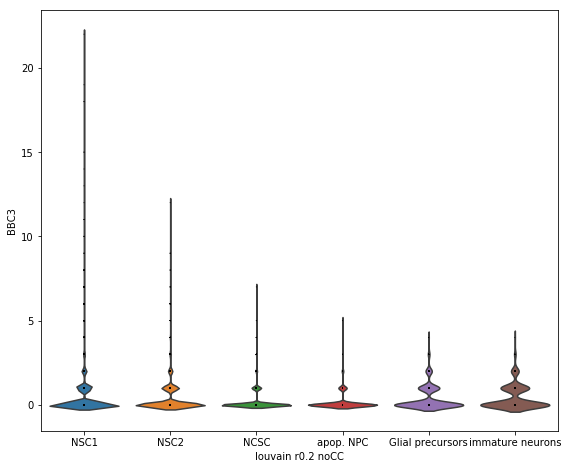

In [71]:
# Distributions on count level
for gene in apoptosis_markers:
    if gene in adata_test.var_names:
        sc.pl.violin(adata_test, gene, groupby='louvain_r0.2_noCC', use_raw=False, jitter=False)

In [87]:
adata = adata.copy()

In [88]:
#sc.tl.score_genes(adata, apoptosis_markers, score_name='apop_score', use_raw=True)
sc.tl.score_genes(adata, apoptosis_markers, score_name='apop_score_corr', use_raw=False)

computing score 'apop_score_corr'
    finished (0:00:42)


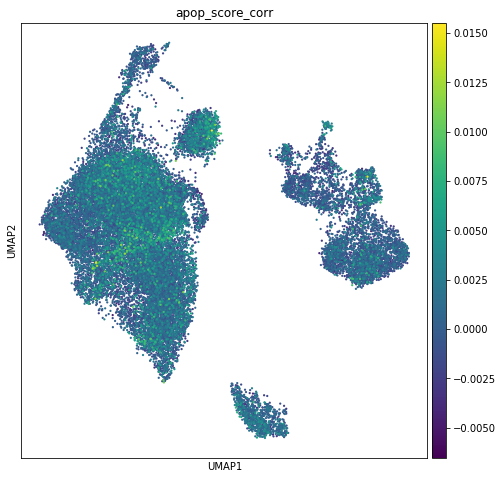

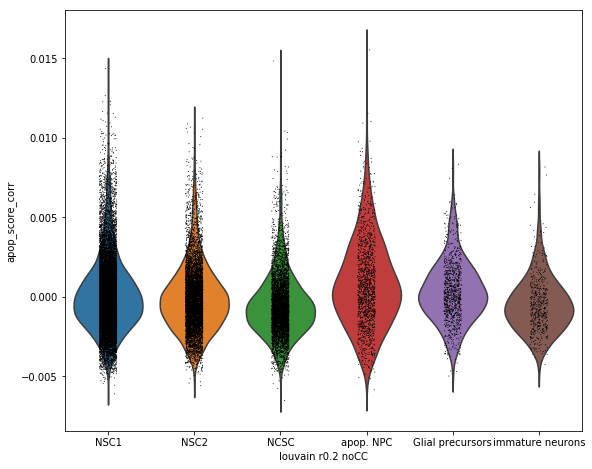

In [89]:
#sc.pl.umap(adata, color='apop_score', size=20)
sc.pl.umap(adata, color='apop_score_corr', size=20)
#sc.pl.violin(adata, 'apop_score', groupby='louvain_r0.2_noCC')
sc.pl.violin(adata, 'apop_score_corr', groupby='louvain_r0.2_noCC')

# Cell death analysis

Due to the ... we are interested in cell death. Thus we look at... here.

In [90]:
cell_death_markers = dict()
cell_death_markers['Ferroptosis_pos'] = ['VDAC2', 'VDAC3', 'NRAS', 'KRAS', 'NOX1', 'NOX4', 'NOX5', 'TFRC', 'TP53', 'CARS', 'ACSL4']
cell_death_markers['Ferroptosis_neg'] = ['GPX4', 'SLC7A11', 'HSPB1', 'NFE2L2']
cell_death_markers['Apoptosis_pos'] = ['TP53', 'BAX', 'BAK1'] #other pro apoptotic BCL2 family members
cell_death_markers['Apoptosis_neg'] = ['BCL2', 'BCL2L1', 'MCL1'] #other anti apoptotic BCL2 family members
cell_death_markers['Necroptosis_pos'] = ['RIPK1', 'RIPK3', 'MLKL']
cell_death_markers['Autophagy_pos'] = ['ATG5', 'ATG7', 'BECN1'] #other ATG family proteins
cell_death_markers['Pathanatos_pos'] = ['AIFM1', 'PARP1']

computing score 'Ferroptosis_pos_corr'
    finished (0:00:16)


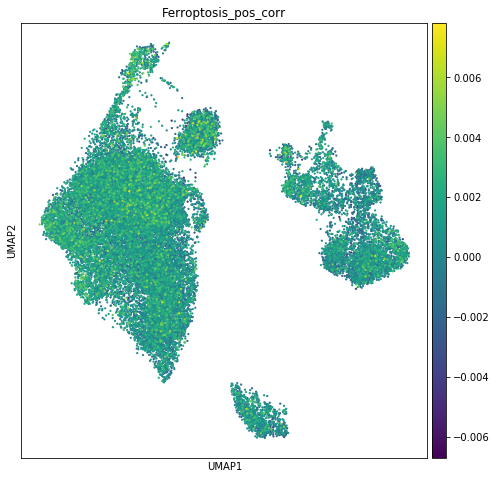

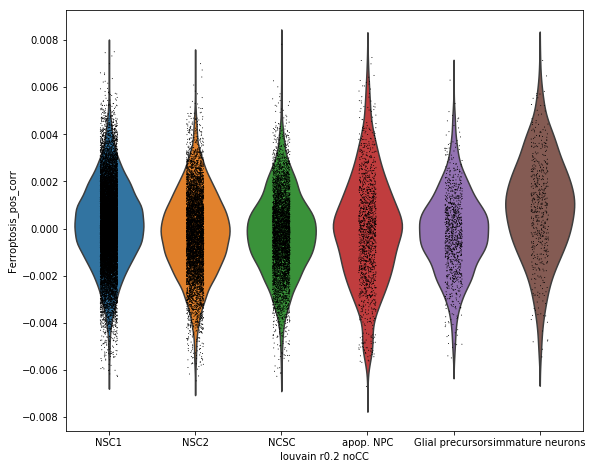

computing score 'Ferroptosis_neg_corr'
    finished (0:00:13)


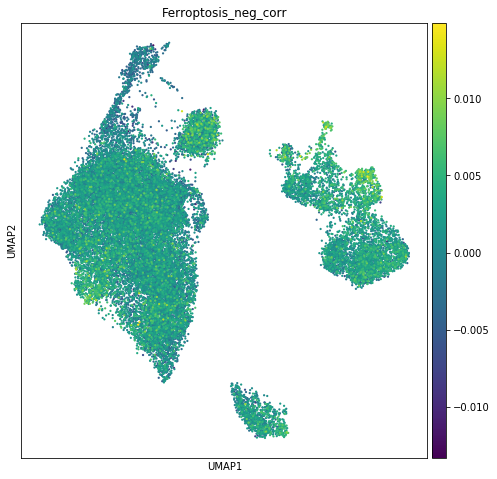

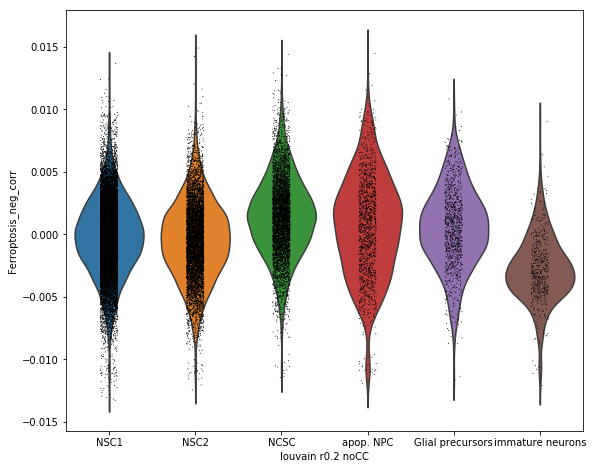

computing score 'Apoptosis_pos_corr'
    finished (0:00:14)


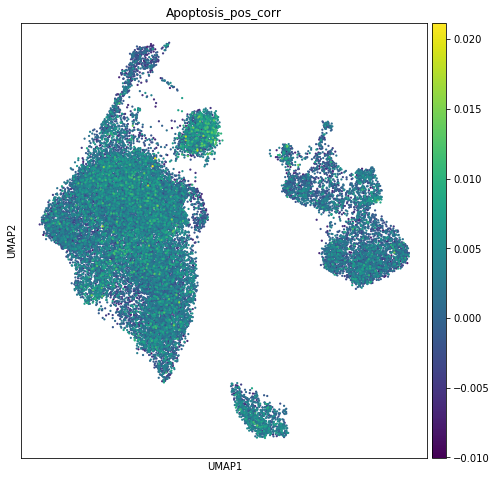

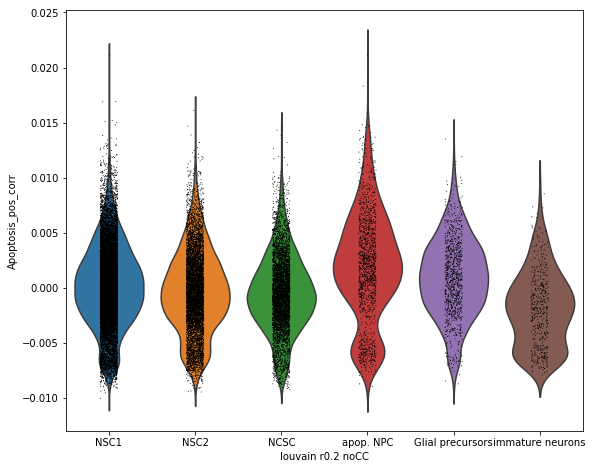

computing score 'Apoptosis_neg_corr'
    finished (0:00:13)


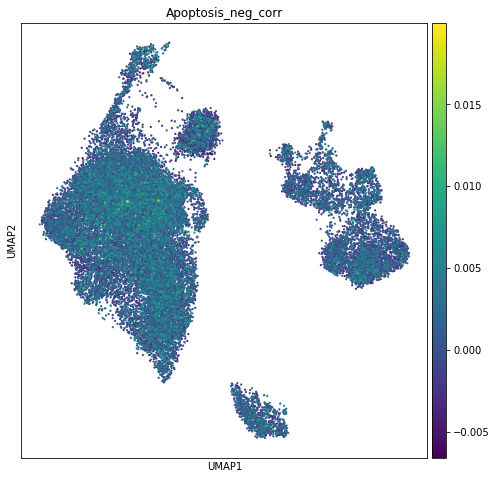

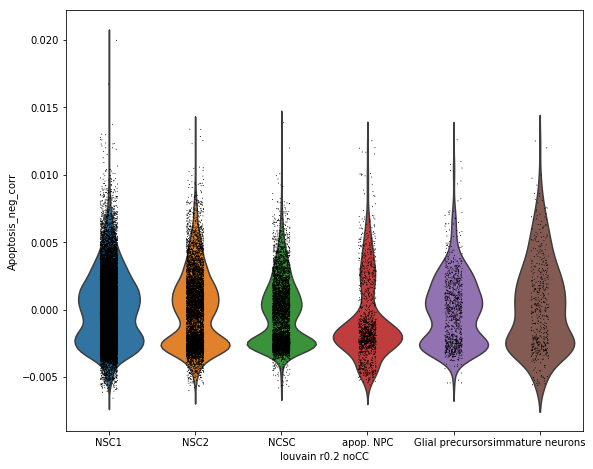

computing score 'Necroptosis_pos_corr'
    finished (0:00:13)


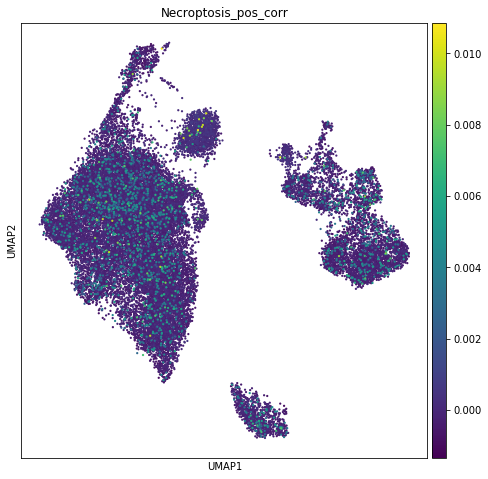

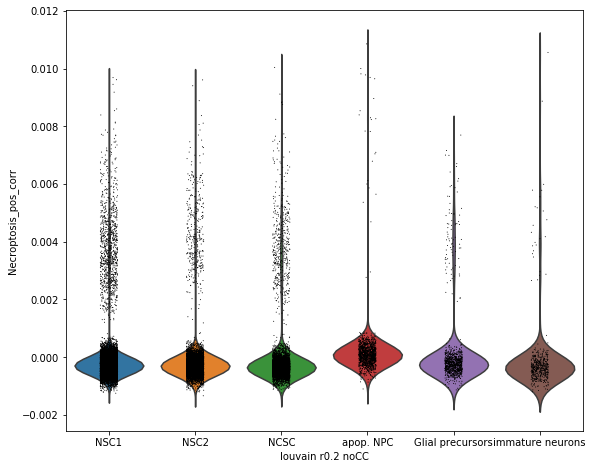

computing score 'Autophagy_pos_corr'
    finished (0:00:13)


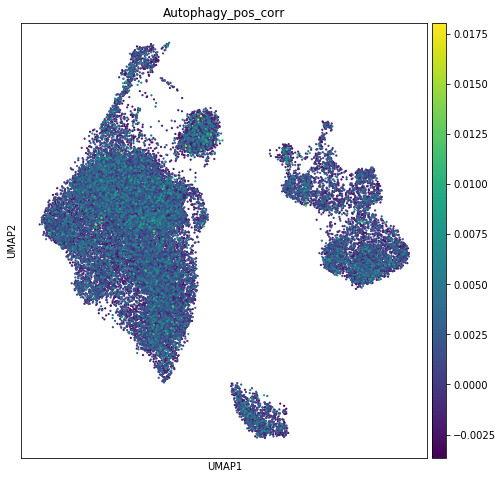

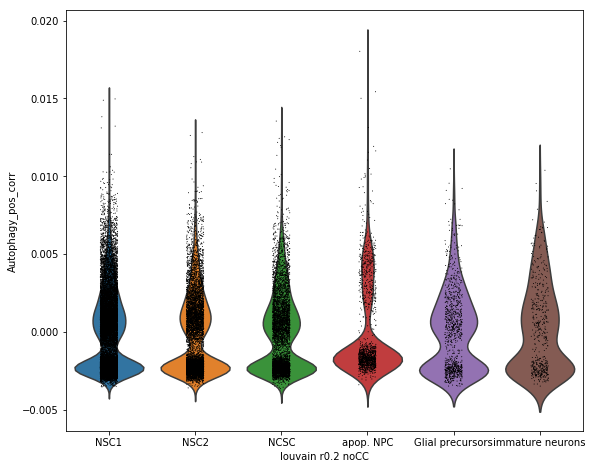

computing score 'Pathanatos_pos_corr'
    finished (0:00:13)


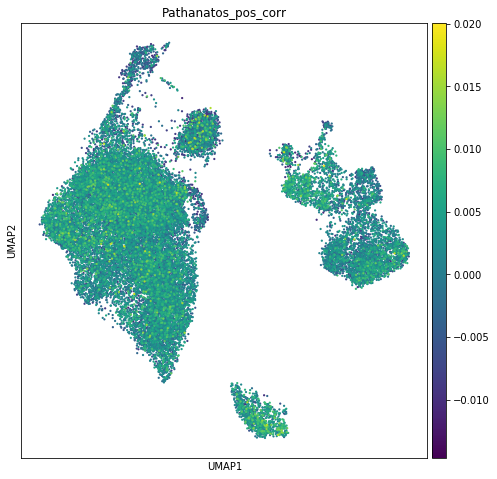

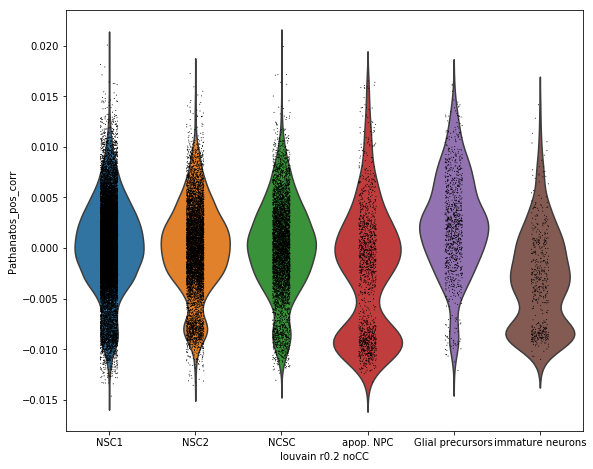

In [92]:
for cd_type in cell_death_markers:
    if len(set(cell_death_markers[cd_type]).intersection(set(adata.var_names))) < 2:
        print(f'{cd_type} score cannot be calculated as there are insufficient markers in the dataset')
    else:
        #sc.tl.score_genes(adata, cell_death_markers[cd_type], score_name=cd_type+'_raw', use_raw=True)
        sc.tl.score_genes(adata, cell_death_markers[cd_type], score_name=cd_type+'_corr', use_raw=False)
        
        #sc.pl.umap(adata, color=cd_type+'_raw', size=20)
        sc.pl.umap(adata, color=cd_type+'_corr', size=20)
        #sc.pl.violin(adata, cd_type+'_raw', groupby='louvain_r0.2_noCC')
        sc.pl.violin(adata, cd_type+'_corr', groupby='louvain_r0.2_noCC')

# Plot technical covariates

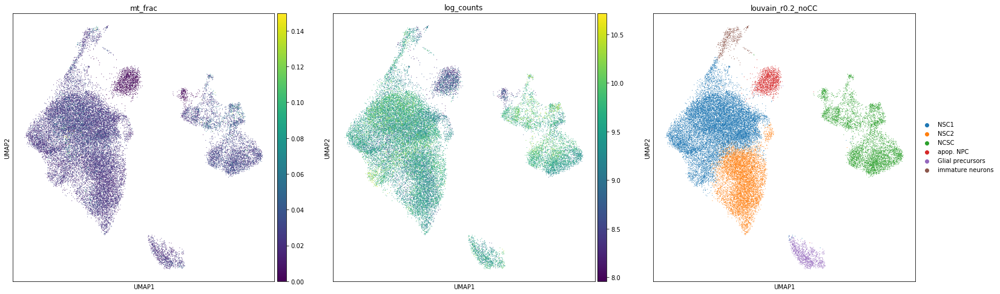

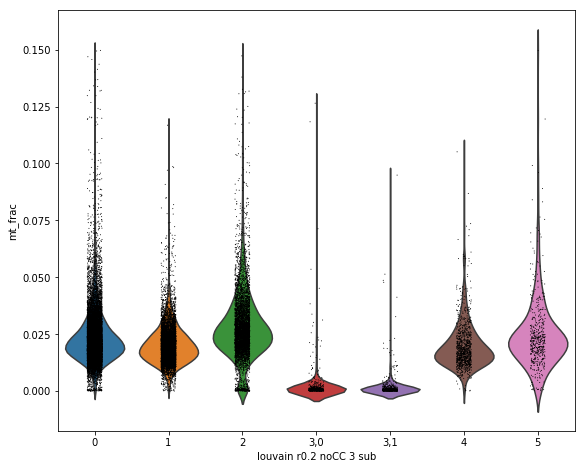

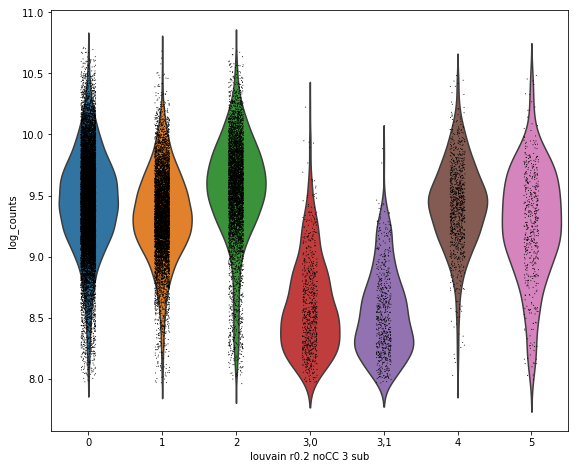

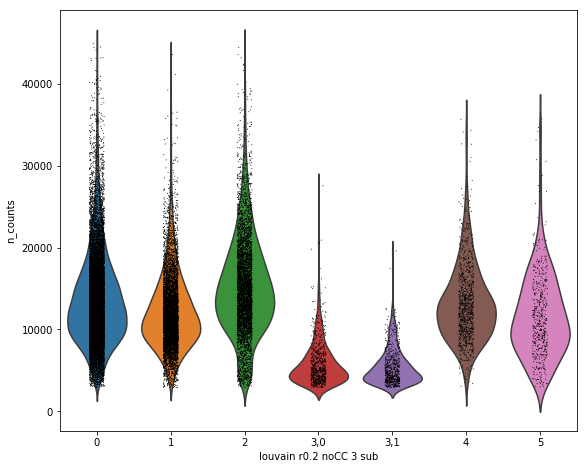

In [93]:
sc.pl.umap(adata, color=['mt_frac', 'log_counts', 'louvain_r0.2_noCC'])
sc.pl.violin(adata, 'mt_frac', groupby='louvain_r0.2_noCC_3_sub')
sc.pl.violin(adata, 'log_counts', groupby='louvain_r0.2_noCC_3_sub')
sc.pl.violin(adata, 'n_counts', groupby='louvain_r0.2_noCC_3_sub')

# Some more plots

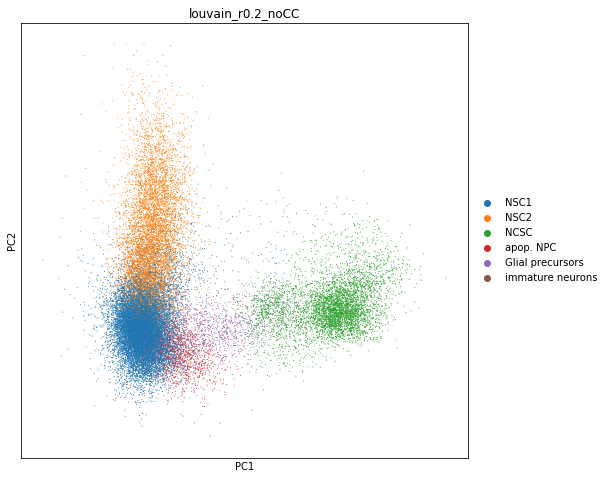

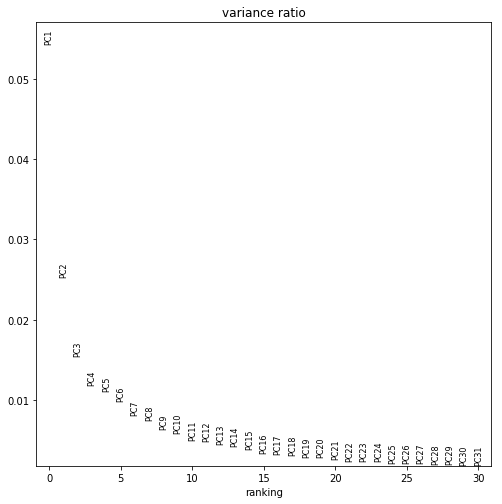

In [94]:
sc.pl.pca(adata, color='louvain_r0.2_noCC')
sc.pl.pca_variance_ratio(adata)

## Subclustering NCSC

There is a low MT frac cell population in NCSC that looks similar to the 'late NPC' cluster. Here we subcluster NCSCs to find this cluster.

In [102]:
sc.tl.louvain(adata, restrict_to=('louvain_r0.2_noCC', ['NCSC']), resolution=0.3, key_added='louvain_r0.2_noCC_NCSC_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


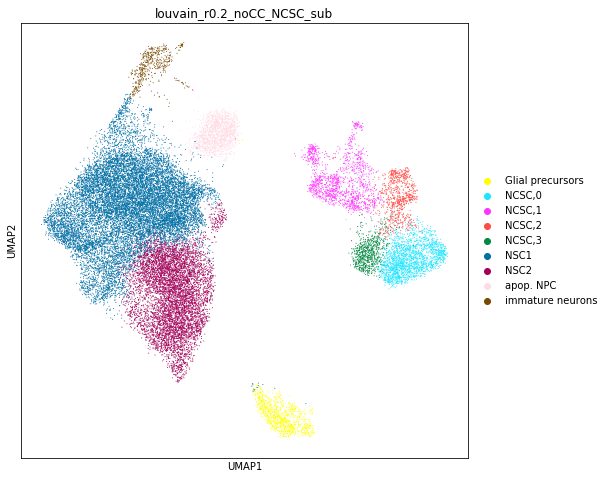

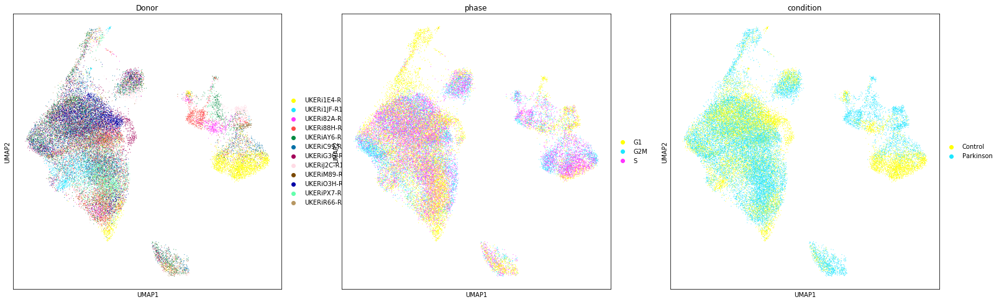

In [103]:
#Show the new clustering
sc.pl.umap(adata, color='louvain_r0.2_noCC_NCSC_sub', palette=sc.pl.palettes.godsnot_64)
sc.pl.umap(adata, color=['Donor', 'phase', 'condition'], palette=sc.pl.palettes.godsnot_64)

Further subclustering to label the low MT cluster

In [108]:
sc.tl.louvain(adata, restrict_to=('louvain_r0.2_noCC_NCSC_sub', ['NCSC,1']), resolution=0.1, key_added='louvain_r0.2_noCC_NCSC_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


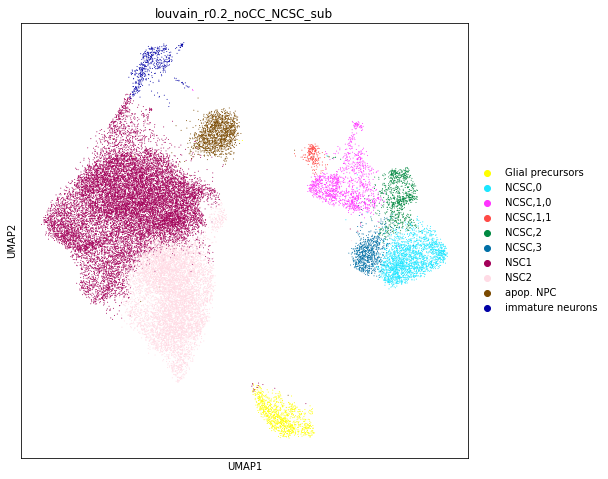

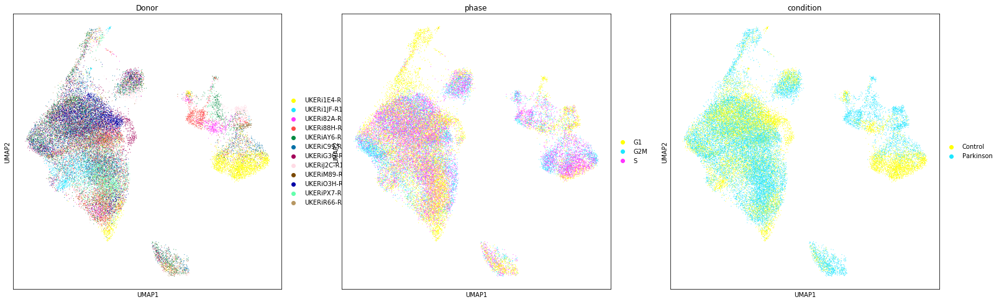

In [109]:
#Show the new clustering
sc.pl.umap(adata, color='louvain_r0.2_noCC_NCSC_sub', palette=sc.pl.palettes.godsnot_64)
sc.pl.umap(adata, color=['Donor', 'phase', 'condition'], palette=sc.pl.palettes.godsnot_64)

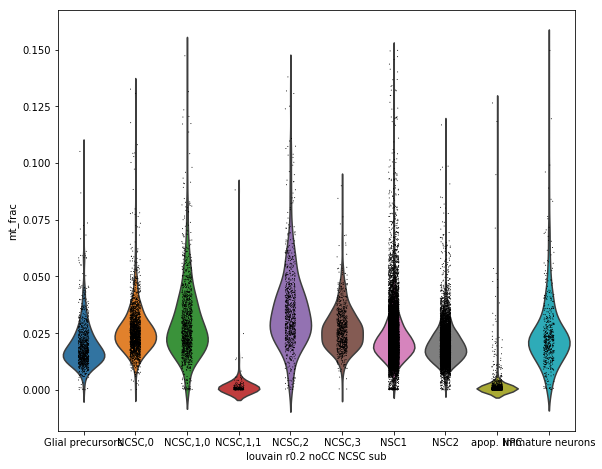

In [110]:
sc.pl.violin(adata, 'mt_frac', groupby='louvain_r0.2_noCC_NCSC_sub')


'NCSC,4' is the low MT fraction cluster that has a similar phenotype to the 'late NPC' cluster. The other three clusters can be merged again.

In [111]:
tmp = []
for clab in adata.obs['louvain_r0.2_noCC_NCSC_sub']:
    if clab == 'NCSC,1,1':
        tmp.append('apop. NCSC')
    elif clab.startswith('NCSC'):
        tmp.append('NCSC')
    else:
        tmp.append(clab)
        
adata.obs['louvain_r0.2_noCC_NCSC_sub'] = tmp

... storing 'louvain_r0.2_noCC_NCSC_sub' as categorical


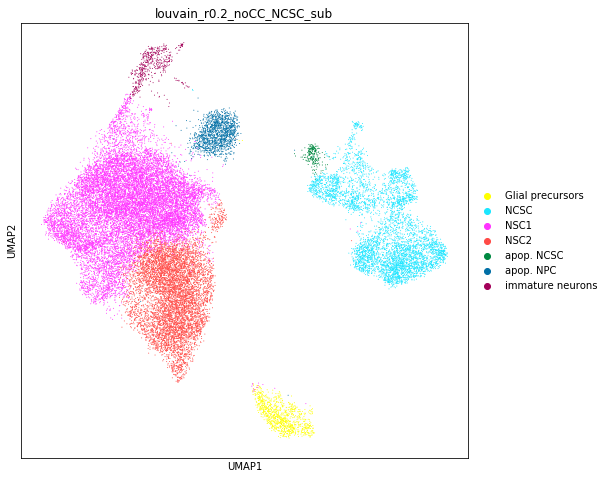

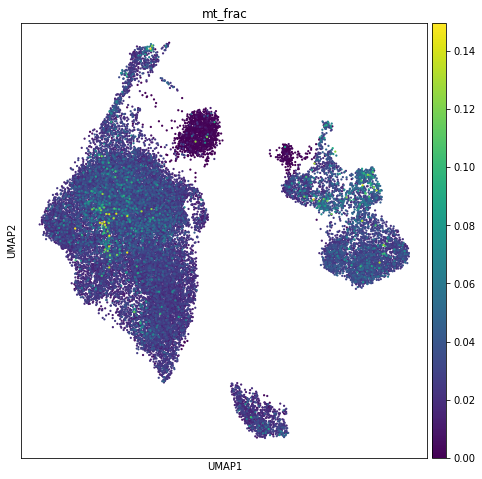

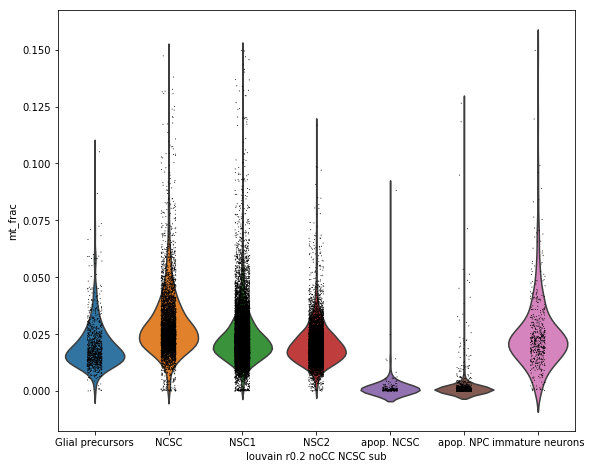

In [112]:
sc.pl.umap(adata, color='louvain_r0.2_noCC_NCSC_sub', palette=sc.pl.palettes.godsnot_64)
sc.pl.umap(adata, color='mt_frac', size=20)
sc.pl.violin(adata, 'mt_frac', groupby='louvain_r0.2_noCC_NCSC_sub')

## Marker genes

In [113]:
adata.obs['louvain_r0.2_noCC_NCSC_sub'].value_counts()

NSC1                15398
NSC2                 7039
NCSC                 5013
apop. NPC            1393
Glial precursors      999
immature neurons      504
apop. NCSC            211
Name: louvain_r0.2_noCC_NCSC_sub, dtype: int64

In [114]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC_NCSC_sub', key_added='rank_genes_r0.2_noCC_NCSC_sub')

ranking genes
    finished (0:01:11)


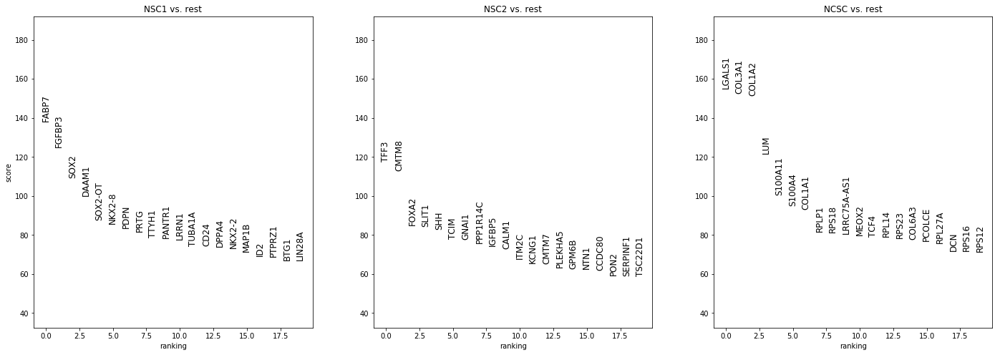

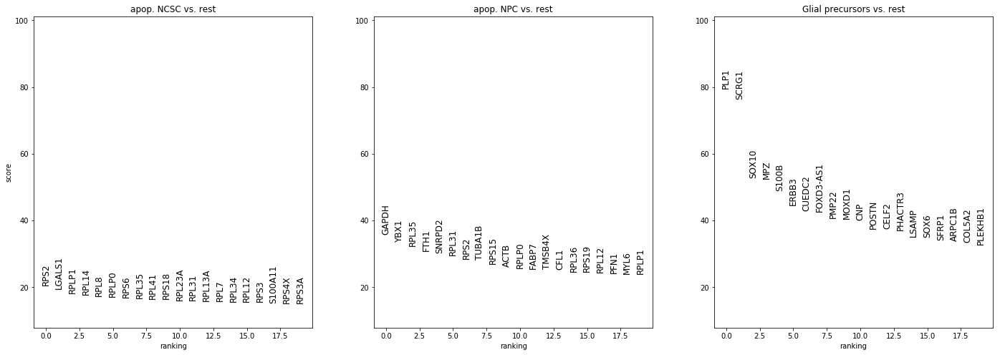

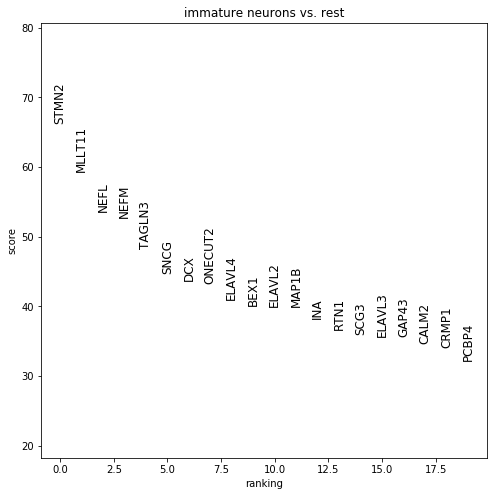

In [115]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub', groups=['NSC1','NSC2','NCSC'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub', groups=['apop. NCSC','apop. NPC','Glial precursors'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub', groups=['immature neurons'], fontsize=12)

### Marker genes on corrected data (no CC, MNN integrated)

Use wilcoxon here as distribution assumptions are unlikely to be met in corrected data.

In [116]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC_NCSC_sub', key_added='rank_genes_r0.2_noCC_NCSC_sub_corr', use_raw=False, method='wilcoxon')

ranking genes


/home/icb/malte.luecken/new_scanpy/scanpy/scanpy/tools/_rank_genes_groups.py:388: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


    finished (0:01:56)


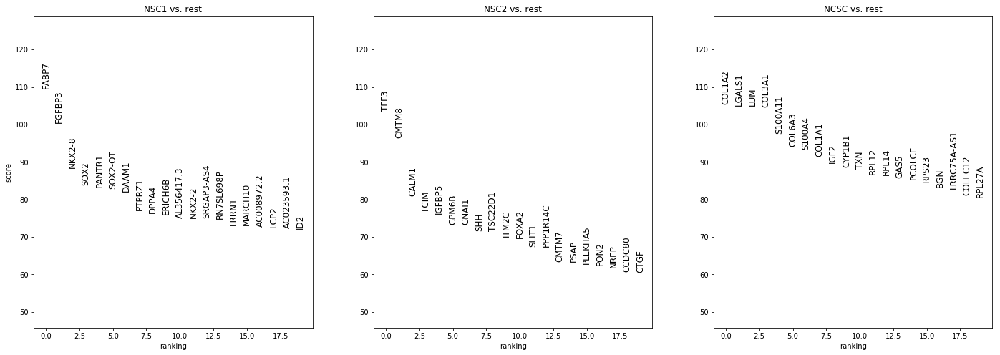

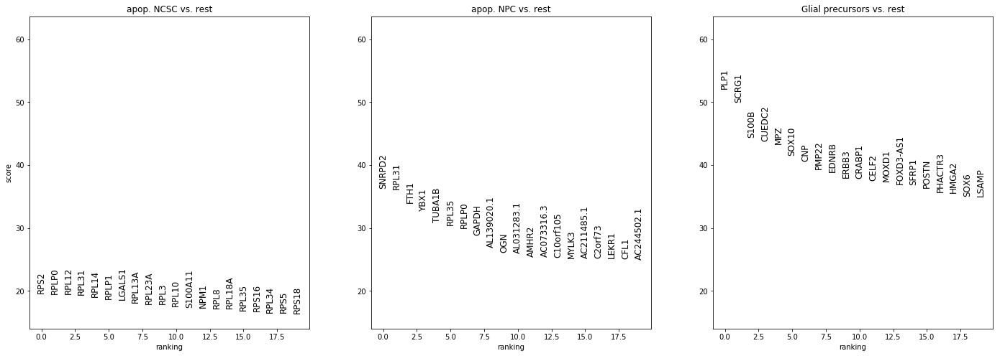

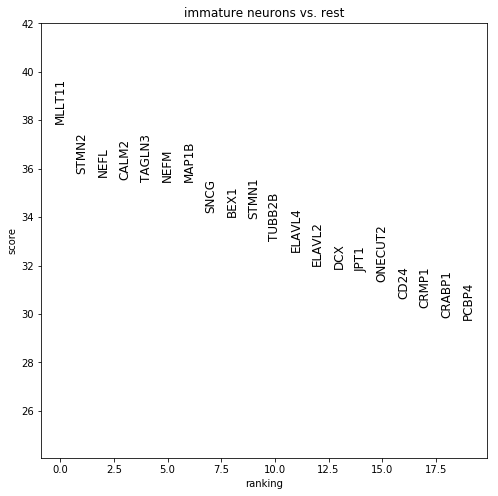

In [117]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub_corr', groups=['NSC1','NSC2','NCSC'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub_corr', groups=['apop. NCSC','apop. NPC','Glial precursors'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub_corr', groups=['immature neurons'], fontsize=12)

### Output marker genes

In [118]:
pd.DataFrame(adata.uns['rank_genes_r0.2_noCC_NCSC_sub']['names']).to_csv(folder+marker_genes_base+'_r0.2_noCC_NCSC_sub.csv')

In [119]:
pd.DataFrame(adata.uns['rank_genes_r0.2_noCC_NCSC_sub_corr']['names']).to_csv(folder+marker_genes_base+'_r0.2_noCC_NCSC_sub_corr.csv')

# Highly expressed genes in apop. NCSC and apop. NPC

In [120]:
adata.raw._varm = None

In [121]:
adata_ncsc_lowmt = adata[[c == 'apop. NCSC' for c in adata.obs['louvain_r0.2_noCC_NCSC_sub']]].copy()
adata_late_npc = adata[[c == 'apop. NPC' for c in adata.obs['louvain_r0.2_noCC_NCSC_sub']]].copy()

normalizing by total count per cell
filtered out 210 cells that haveless than 1 counts
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


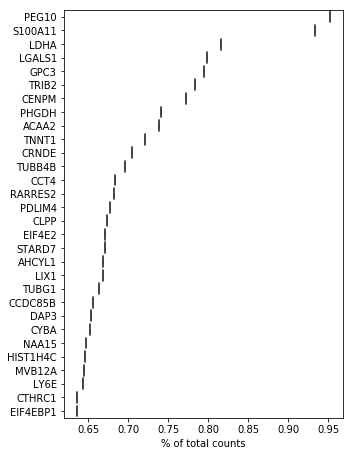

normalizing by total count per cell
filtered out 1392 cells that haveless than 1 counts
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


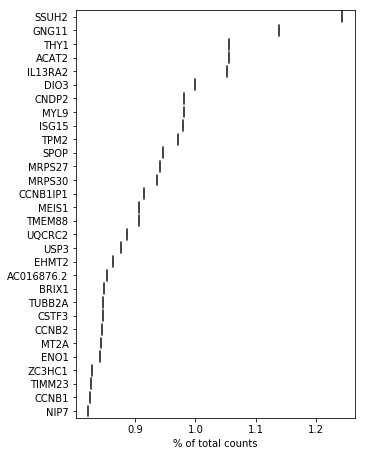

In [122]:
sc.pl.highest_expr_genes(adata_ncsc_lowmt, n_top=30)
sc.pl.highest_expr_genes(adata_late_npc, n_top=30)

In [123]:
adata_ncsc_lowmt.X = adata_ncsc_lowmt.raw.X
adata_late_npc.X = adata_late_npc.raw.X

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


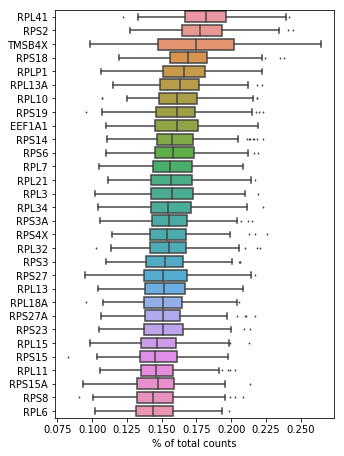

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


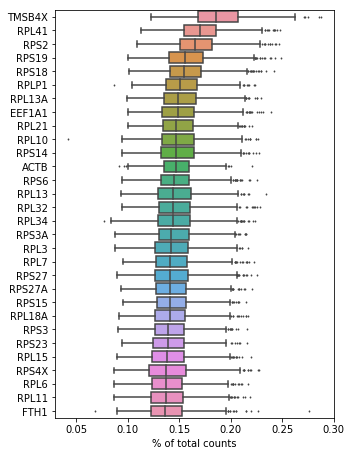

In [124]:
sc.pl.highest_expr_genes(adata_ncsc_lowmt, n_top=30)
sc.pl.highest_expr_genes(adata_late_npc, n_top=30)

In [125]:
adata_ncsc_lowmt.X = adata_ncsc_lowmt.layers['counts']
adata_late_npc.X = adata_late_npc.layers['counts']

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


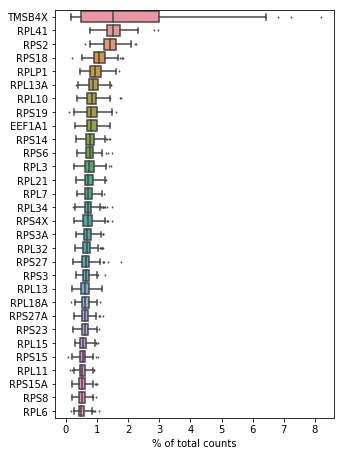

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


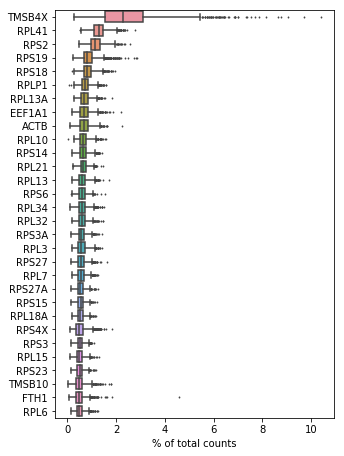

In [126]:
sc.pl.highest_expr_genes(adata_ncsc_lowmt, n_top=30)
sc.pl.highest_expr_genes(adata_late_npc, n_top=30)

# Diff expr of low MT clusters to rest

### NCSC (low MT) vs NCSC

In [127]:
#Differential expression using t-test-overestim-var between NCSC and low MT NCSC
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC_NCSC_sub', groups=['apop. NCSC'], reference='NCSC', key_added='rank_genes_r0.2_noCC_NCSC_sub_NCSClowMT_upreg')
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.2_noCC_NCSC_sub', groups=['NCSC'], reference='apop. NCSC', key_added='rank_genes_r0.2_noCC_NCSC_sub_NCSClowMT_downreg')

ranking genes
    finished (0:00:01)
ranking genes
    finished (0:00:00)


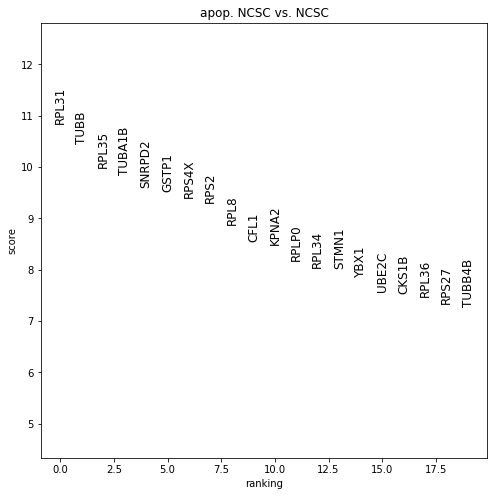

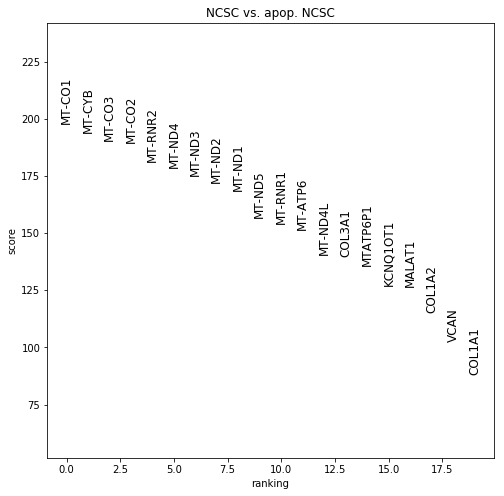

In [128]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub_NCSClowMT_upreg', groups=['apop. NCSC'], fontsize=12)
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_NCSC_sub_NCSClowMT_downreg', groups=['NCSC'], fontsize=12)

### apop. NPC vs NSC

In [129]:
tmp = []
for clab in adata.obs['louvain_r0.2_noCC_NCSC_sub']:
    
    if (clab == 'NSC1') or (clab == 'NSC2'):
        tmp.append('NSC')
    else:
        tmp.append(clab)

adata.obs['test_groups'] = tmp

... storing 'test_groups' as categorical


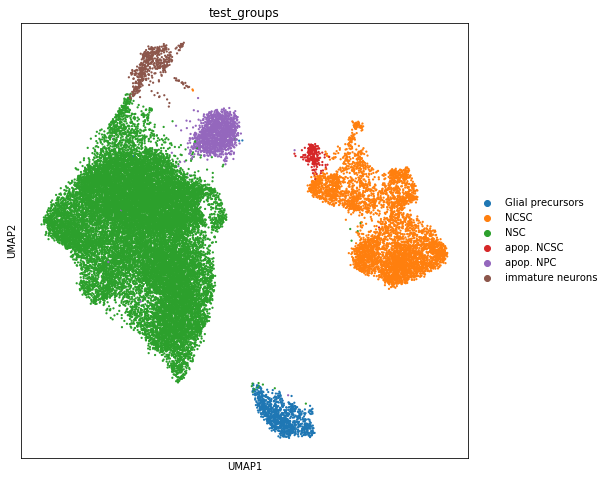

In [130]:
sc.pl.umap(adata, color='test_groups', size=20)

In [131]:
#Differential expression using t-test-overestim-var between NCSC and low MT NCSC
sc.tl.rank_genes_groups(adata, groupby='test_groups', groups=['apop. NPC'], reference='NSC', key_added='rank_genes_r0.2_noCC_lateNPC_vs_NSC_upreg')
sc.tl.rank_genes_groups(adata, groupby='test_groups', groups=['NSC'], reference='apop. NPC', key_added='rank_genes_r0.2_noCC_lateNPC_vs_NSC_downreg')

ranking genes
    finished (0:00:04)
ranking genes
    finished (0:00:02)


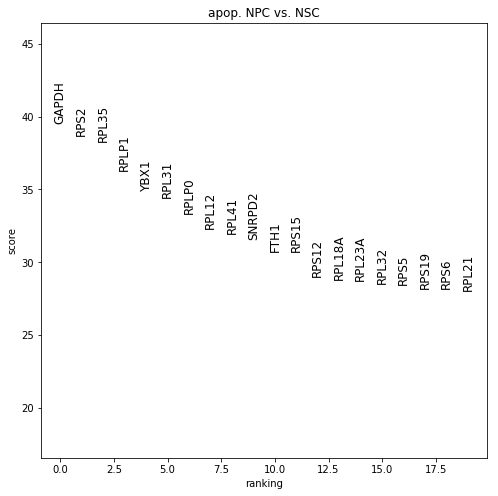

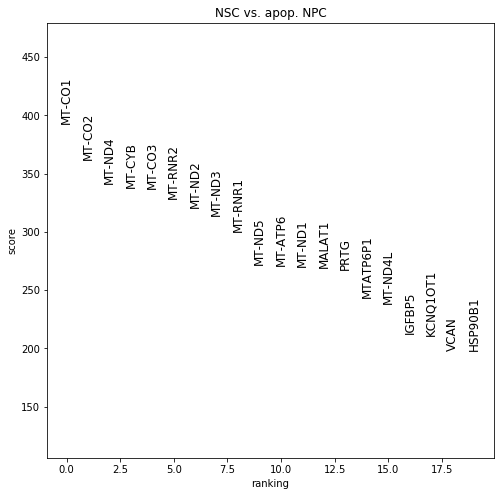

In [132]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_lateNPC_vs_NSC_upreg', groups=['apop. NPC'], fontsize=12)
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.2_noCC_lateNPC_vs_NSC_downreg', groups=['NSC'], fontsize=12)

# Output the data to file

In [163]:
# Remove rank_genes_groups output, which is tough to save to file
ad_uns_keys = list(adata.uns.keys())

for i in ad_uns_keys:
    if i.startswith('rank_'):
        print(f'removing {i}')
        del adata.uns[i]

removing rank_genes_r0.2_0_3_sub
removing rank_genes_r0.2_0_4_sub
removing rank_genes_r0.2_0_sub
removing rank_genes_r0.2_noCC
removing rank_genes_r0.2_noCC_corr
removing rank_genes_r0.2_noCC_3_sub
removing rank_genes_r0.2_noCC_3_sub_comp0
removing rank_genes_r0.2_noCC_3_sub_comp1
removing rank_genes_r0.2_noCC_NCSC_sub
removing rank_genes_r0.2_noCC_NCSC_sub_corr
removing rank_genes_r0.2_noCC_NCSC_sub_NCSClowMT_upreg
removing rank_genes_r0.2_noCC_NCSC_sub_NCSClowMT_downreg
removing rank_genes_r0.2_noCC_lateNPC_vs_NSC_upreg
removing rank_genes_r0.2_noCC_lateNPC_vs_NSC_downreg


In [164]:
adata.write(adata_full_noCC)

# Output new clustering labels

In [165]:
adata.obs['louvain_r0.2_noCC_NCSC_sub'].to_csv(folder+"intermediate_data/ipsc_ipd_patients_noCC_cluster_labels.csv")

/home/icb/malte.luecken/anaconda3/envs/sc-tutorial/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.
